______________
<font color = blue size = 12><center> **Credit Scoring**</font>

    
    
<font  size = 3><center> ***Machine Learning MBA Project***


    


    
    
 

<font  size = 3><center>**Author:** [Camila Maestrelli](https://www.linkedin.com/in/camila-maestrelli-leobons/)
    
    
______

## **Project Steps:**
1. Problem definition
2. Data Import / Understanding the data
3. Data Cleaning
4. EDA
5. Preprocessing
6. Algorithm and model criation
7. Result Interpretation and model evaluation

## <code style="background:lightgray;color:green">1. Problem definition</code> 

Can you predict how capable each applicant is of repaying a loan?

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

Home Credit Group https://www.homecredit.net/

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

_________________________________________________________________________
So, this project aims to predict whether a person would repay a loan or not

## <code style="background:lightgray;color:green">2. Data import / Understanding the data</code> 

The dataset used in this project can be download from: https://www.kaggle.com/competitions/home-credit-default-risk

In this section, the dataset is analyzed considering the type of the varibles and the metadata

### 2.1 Importing the dataset

In [2]:
import opendatasets as od

od.download("https://www.kaggle.com/competitions/home-credit-default-risk")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: camilaml86
Your Kaggle Key: ········


100%|██████████| 688M/688M [03:06<00:00, 3.87MB/s] 



Extracting archive .\home-credit-default-risk/home-credit-default-risk.zip to .\home-credit-default-risk


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [2]:
path = 'home-credit-default-risk'
os.listdir(path)

['application_test.csv',
 'application_train.csv',
 'bureau.csv',
 'bureau_balance.csv',
 'credit_card_balance.csv',
 'HomeCredit_columns_description.csv',
 'installments_payments.csv',
 'POS_CASH_balance.csv',
 'previous_application.csv',
 'sample_submission.csv']

In this project, we are only analyzing the <code style="background:pink;color:black">**application_train**</code>



___________
**Dataset Description**

`application_{train|test}.csv`

This is the main table, broken into two files for Train (with TARGET) and Test (without TARGET).
Static data for all applications. One row represents one loan in our data sample.

`bureau.csv`

All client's previous credits provided by other financial institutions that were reported to Credit Bureau (for clients who have a loan in our sample).
For every loan in our sample, there are as many rows as number of credits the client had in Credit Bureau before the application date.

`bureau_balance.csv`

Monthly balances of previous credits in Credit Bureau.
This table has one row for each month of history of every previous credit reported to Credit Bureau – i.e the table has (#loans in sample * # of relative previous credits * # of months where we have some history observable for the previous credits) rows.

`POS_CASH_balance.csv`

Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit.
This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credits * # of months in which we have some history observable for the previous credits) rows.

`credit_card_balance.csv`

Monthly balance snapshots of previous credit cards that the applicant has with Home Credit.
This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credit cards * # of months where we have some history observable for the previous credit card) rows.

`previous_application.csv`

All previous applications for Home Credit loans of clients who have loans in our sample.
There is one row for each previous application related to loans in our data sample.

`installments_payments.csv`

Repayment history for the previously disbursed credits in Home Credit related to the loans in our sample.
There is a) one row for every payment that was made plus b) one row each for missed payment.
One row is equivalent to one payment of one installment OR one installment corresponding to one payment of one previous Home Credit credit related to loans in our sample.

`HomeCredit_columns_description.csv`

This file contains descriptions for the columns in the various data files.



<img src="https://storage.googleapis.com/kaggle-media/competitions/home-credit/home_credit.png" alt="PNG" />


_______

In [195]:
url = 'home-credit-default-risk/application_train.csv'
df = pd.read_csv(url)
dataset = df.copy()

In [185]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


### 2.2 Understanding the data

In [13]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

* It can be seen that there are a lot of columns with missing values

In [5]:
url_description = 'home-credit-default-risk/HomeCredit_columns_description.csv'
description = pd.read_csv(url_description,  encoding_errors='ignore')
description

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
...,...,...,...,...,...
214,217,installments_payments.csv,NUM_INSTALMENT_NUMBER,On which installment we observe payment,NaN
215,218,installments_payments.csv,DAYS_INSTALMENT,When the installment of previous credit was su...,time only relative to the application
216,219,installments_payments.csv,DAYS_ENTRY_PAYMENT,When was the installments of previous credit p...,time only relative to the application
217,220,installments_payments.csv,AMT_INSTALMENT,What was the prescribed installment amount of ...,NaN


In [22]:
description_application = description.loc[description.Table == 'application_{train|test}.csv']
description_application = description_application[['Row', 'Description']]
description_application

,Row,Description
0,SK_ID_CURR,ID of loan in our sample
1,TARGET,Target variable (1 - client with payment diffi...
2,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving
3,CODE_GENDER,Gender of the client
4,FLAG_OWN_CAR,Flag if the client owns a car
...,...,...
117,AMT_REQ_CREDIT_BUREAU_DAY,Number of enquiries to Credit Bureau about the...
118,AMT_REQ_CREDIT_BUREAU_WEEK,Number of enquiries to Credit Bureau about the...
119,AMT_REQ_CREDIT_BUREAU_MON,Number of enquiries to Credit Bureau about the...
120,AMT_REQ_CREDIT_BUREAU_QRT,Number of enquiries to Credit Bureau about the...


In [57]:
for linha in description_application.iterrows():
    print('|', linha[0]+1, '|' ,linha[1][0], '|', linha[1][1], '|')

| 1 | SK_ID_CURR | ID of loan in our sample |
| 2 | TARGET | Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases) |
| 3 | NAME_CONTRACT_TYPE | Identification if loan is cash or revolving |
| 4 | CODE_GENDER | Gender of the client |
| 5 | FLAG_OWN_CAR | Flag if the client owns a car |
| 6 | FLAG_OWN_REALTY | Flag if client owns a house or flat |
| 7 | CNT_CHILDREN | Number of children the client has |
| 8 | AMT_INCOME_TOTAL | Income of the client |
| 9 | AMT_CREDIT | Credit amount of the loan |
| 10 | AMT_ANNUITY | Loan annuity |
| 11 | AMT_GOODS_PRICE | For consumer loans it is the price of the goods for which the loan is given |
| 12 | NAME_TYPE_SUITE | Who was accompanying client when he was applying for the loan |
| 13 | NAME_INCOME_TYPE | Clients income type (businessman, working, maternity leave,) |
| 14 | NAME_EDUCATION_TYPE | Level of highest edu

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_15052\1268207637.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('|', linha[0]+1, '|' ,linha[1][0], '|', linha[1][1], '|')


**Applications Columns Description**
____

|#|Column|Decription|
|---|---|---|
| 1 | SK_ID_CURR | ID of loan  |
| 2 | TARGET | 1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases |
| 3 | NAME_CONTRACT_TYPE | if loan is cash or revolving |
| 4 | CODE_GENDER | Gender of the client |
| 5 | FLAG_OWN_CAR | if the client owns a car |
| 6 | FLAG_OWN_REALTY | if client owns a house or flat |
| 7 | CNT_CHILDREN | Number of children the client has |
| 8 | AMT_INCOME_TOTAL | Income of the client |
| 9 | AMT_CREDIT | Credit amount of the loan |
| 10 | AMT_ANNUITY | Loan annuity |
| 11 | AMT_GOODS_PRICE | For consumer loans it is the price of the goods for which the loan is given |
| 12 | NAME_TYPE_SUITE | Who was accompanying client when he was applying for the loan |
| 13 | NAME_INCOME_TYPE | Clients income type (businessman, working, maternity leave,) |
| 14 | NAME_EDUCATION_TYPE | Level of highest education the client achieved |
| 15 | NAME_FAMILY_STATUS | Family status of the client |
| 16 | NAME_HOUSING_TYPE | What is the housing situation of the client (renting, living with parents, ...) |
| 17 | REGION_POPULATION_RELATIVE | Normalized population of region where client lives (higher number means the client lives in more populated region) |
| 18 | DAYS_BIRTH | Client's age in days at the time of application |
| 19 | DAYS_EMPLOYED | How many days before the application the person started current employment |
| 20 | DAYS_REGISTRATION | How many days before the application did client change his registration |
| 21 | DAYS_ID_PUBLISH | How many days before the application did client change the identity document with which he applied for the loan |
| 22 | OWN_CAR_AGE | Age of client's car |
| 23 - 28 | PHONE | 6 columns - Information about phone and email (1=YES, 0=NO) |
| 29 | OCCUPATION_TYPE | What kind of occupation does the client have |
| 30 | CNT_FAM_MEMBERS | How many family members does client have |
| 31 - 32 | REGION_RATING_CLIENT | 2 columns with the Home Credit Group rating of the region where client lives |
| 33 - 34 | _PROCESS_START (suffix) | 2 columns - day and hour did the client apply for the loan |
| 35 - 40 | REG/LIVE_REGION/CITY_NOT_WORK/LIVE_REGION/CITY | 6 columns - infomation about client home and work address  (1=different, 0=same, at region/city level) |
| 41 | ORGANIZATION_TYPE | Type of organization where client works |
| 42 - 44 | EXT_SOURCE (preffix) | 3 columns - score from external data source |
| 45 - 91 | _AVG, _MEDI, _ MODE (suffix) | 47 columns with Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) |
| 92 - 95 | _SOCIAL_CIRCLE (suffix) | 4 columns - How many observation of client's social surroundings |
| 96 | DAYS_LAST_PHONE_CHANGE | How many days before application did client change phone |
| 97 - 116 | FLAG_DOCUMENT (preffix) |20 columns if the client provide the document required |
| 117 - 122 | AMT_REQ_CREDIT_BUREAU (preffix) | 6 columns - Number of enquiries to Credit Bureau about the client |


_____________

#### 2.2.1 Analyzing the description of the columns

Analyzing the description of the columns, there are some things that need to be clarified:
* Considering the description of the columns, the AMT_GOODS_PRICE column should be the same as AMT_CREDIT
* CNT_FAM_MEMBERS and CNT_CHILDREN are probably correlated
* OWN_CAR_AGE column should only present a value if the person owns a car


* ##### AMT_GOODS_PRICE vs AMT_CREDIT

Most of the loans when AMT_CREDIT is different from AMT_GOODS_PRICE are CASH LOANS

Probably the colum AMT_GOODS_PRICE will not add to the model, unless we make it a binary column considering True (or 1) when the person got a loan for a spespecific good

In [186]:
df[(df['AMT_CREDIT'] == df['AMT_GOODS_PRICE'])].NAME_CONTRACT_TYPE.value_counts(normalize= True)*100

NAME_CONTRACT_TYPE
Cash loans         73.502449
Revolving loans    26.497551
Name: proportion, dtype: float64

In [187]:
df[~(df['AMT_CREDIT'] == df['AMT_GOODS_PRICE'])].NAME_CONTRACT_TYPE.value_counts(normalize= True)*100

NAME_CONTRACT_TYPE
Cash loans         99.695937
Revolving loans     0.304063
Name: proportion, dtype: float64

* ##### CNT_FAM_MEMBERS vs CNT_CHILDREN

When family members is igual to 1, there is only the person who applied for the loan in the family.

When there are more 2 (excluding the kids), probably the person lives with a partner

In [188]:
(df['CNT_FAM_MEMBERS'] - df['CNT_CHILDREN']).describe()

count    307509.000000
mean          1.735611
std           0.441008
min           1.000000
25%           1.000000
50%           2.000000
75%           2.000000
max           2.000000
dtype: float64

* ##### OWN_CAR_AGE vs FLAG_OWN_CAR


5 people that own a car does not present the car´s age. For these, maybe the best way is to impute the median

For the others that really does not own a car, we can impute using a very large number (to analyze)

In [61]:
df[df.OWN_CAR_AGE.isna()].FLAG_OWN_CAR.value_counts()

FLAG_OWN_CAR
N    202924
Y         5
Name: count, dtype: int64

In [64]:
df[~df.OWN_CAR_AGE.isna()].FLAG_OWN_CAR.value_counts()

FLAG_OWN_CAR
Y    104582
Name: count, dtype: int64

In [74]:
df[df.OWN_CAR_AGE.isna()].TARGET.value_counts(normalize=True)*100

TARGET
0    91.499983
1     8.500017
Name: proportion, dtype: float64

In [75]:
df[~df.OWN_CAR_AGE.isna()].TARGET.value_counts(normalize=True)*100

TARGET
0    92.755924
1     7.244076
Name: proportion, dtype: float64

In [66]:
df.OWN_CAR_AGE.describe()

count    104582.000000
mean         12.061091
std          11.944812
min           0.000000
25%           5.000000
50%           9.000000
75%          15.000000
max          91.000000
Name: OWN_CAR_AGE, dtype: float64

## <code style="background:lightgray;color:green">3. Data Cleaning</code> 


In [151]:
df.duplicated().sum() # There is no duplicated data

0

### 3.1 Transforming boolean to binary

In [6]:
# categorical features
cat_features = df.select_dtypes(include='object').columns.values
cat_features

array(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE',
       'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'], dtype=object)

In [7]:
len(cat_features)

16

In [193]:
for coluna in cat_features:
    print(coluna, ':', df[coluna].nunique())
    print(df[coluna].unique())
    print('------------------------------------')

NAME_CONTRACT_TYPE : 2
['Cash loans' 'Revolving loans']
------------------------------------
CODE_GENDER : 3
['M' 'F' 'XNA']
------------------------------------
NAME_TYPE_SUITE : 6
['Unaccompanied' 'Family' 'Spouse, partner' 'Children' 'Other' nan
 'Group of people']
------------------------------------
NAME_INCOME_TYPE : 8
['Working' 'State servant' 'Commercial associate' 'Pensioner' 'Unemployed'
 'Student' 'Businessman' 'Maternity leave']
------------------------------------
NAME_EDUCATION_TYPE : 5
['Secondary / secondary special' 'Higher education' 'Incomplete higher'
 'Lower secondary' 'Academic degree']
------------------------------------
NAME_FAMILY_STATUS : 6
['Single / not married' 'Married' 'Civil marriage' 'Widow' 'Separated'
 'Unknown']
------------------------------------
NAME_HOUSING_TYPE : 6
['House / apartment' 'Rented apartment' 'With parents'
 'Municipal apartment' 'Office apartment' 'Co-op apartment']
------------------------------------
OCCUPATION_TYPE : 18
['Labor

<code style="background:yellow;color:black">OBSERVATION:</code>
* 2 columns (FLAG_OWN_CAR and FLAG_OWN_REALTY) need to be transformed to 0 or 1

In [8]:
dict_bool = {'Y': 1, 
                 'N': 0}

df['FLAG_OWN_CAR'] = df['FLAG_OWN_CAR'].map(dict_bool)
df['FLAG_OWN_REALTY'] = df['FLAG_OWN_REALTY'].map(dict_bool)

### 3.2 Cleaning irrelevant data in the categorical columns

ORGANIZATION_TYPE: Agregating all Business, Trade, Industry that have more than one type

In [9]:
df.ORGANIZATION_TYPE = df.ORGANIZATION_TYPE.map(lambda x: x.split(':')[0].strip())
df.ORGANIZATION_TYPE = df.ORGANIZATION_TYPE.map(lambda x: x.split('Entity')[0].strip())
df.loc[df.ORGANIZATION_TYPE =='XNA','ORGANIZATION_TYPE' ] = 'Unknown'

In [10]:
df.ORGANIZATION_TYPE .value_counts()

ORGANIZATION_TYPE
Business               84529
Unknown                55374
Self-employed          38412
Other                  16683
Trade                  14315
Industry               14311
Medicine               11193
Government             10404
Transport               8990
School                  8893
Kindergarten            6880
Construction            6721
Security                3247
Housing                 2958
Military                2634
Bank                    2507
Agriculture             2454
Police                  2341
Postal                  2157
Security Ministries     1974
Restaurant              1811
Services                1575
University              1327
Hotel                    966
Electricity              950
Insurance                597
Telecom                  577
Emergency                560
Advertising              429
Realtor                  396
Culture                  379
Mobile                   317
Legal Services           305
Cleaning                 

NAME_TYPE_SUITE: uniting two categories: Other A and Other B

In [11]:
df.loc[df.NAME_TYPE_SUITE  =='Other_A','NAME_TYPE_SUITE' ] = 'Other'
df.loc[df.NAME_TYPE_SUITE  =='Other_B','NAME_TYPE_SUITE' ] = 'Other'

In [12]:
df.NAME_TYPE_SUITE .value_counts()

NAME_TYPE_SUITE
Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other                2636
Group of people       271
Name: count, dtype: int64

### 3.3 Missing Data

In the last section, we noticed that a few columns have missing data. This section is going to analyze this.

In [13]:
# checking missing data
total = df.isnull().sum().sort_values(ascending = False)
percent = (df.isnull().sum()/len(df)*100).sort_values(ascending = False)
missing_df  = pd.concat([total, percent], axis=1, keys=['Total missing', 'Percent'])
index = missing_df[missing_df.Percent>0].index
missing_df[missing_df.Percent>0]

,Total missing,Percent
COMMONAREA_MEDI,214865,69.872297
COMMONAREA_AVG,214865,69.872297
COMMONAREA_MODE,214865,69.872297
NONLIVINGAPARTMENTS_MODE,213514,69.432963
NONLIVINGAPARTMENTS_AVG,213514,69.432963
...,...,...
EXT_SOURCE_2,660,0.214626
AMT_GOODS_PRICE,278,0.090403
AMT_ANNUITY,12,0.003902
CNT_FAM_MEMBERS,2,0.000650


In [14]:
remainder_columns, building_columns = [], []

for column in index:
    if column.endswith("_AVG") or column.endswith("_MODE") or column.endswith("_MEDI"):
        building_columns.append(column)
    else:
        remainder_columns.append(column)

print('Missing from building info: ', len(building_columns))
print(building_columns)

print('Missing remainder: ', len(remainder_columns))
print(remainder_columns)

Missing from building info:  47
['COMMONAREA_MEDI', 'COMMONAREA_AVG', 'COMMONAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAPARTMENTS_MEDI', 'FONDKAPREMONT_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAPARTMENTS_AVG', 'LIVINGAPARTMENTS_MEDI', 'FLOORSMIN_AVG', 'FLOORSMIN_MODE', 'FLOORSMIN_MEDI', 'YEARS_BUILD_MEDI', 'YEARS_BUILD_MODE', 'YEARS_BUILD_AVG', 'LANDAREA_MEDI', 'LANDAREA_MODE', 'LANDAREA_AVG', 'BASEMENTAREA_MEDI', 'BASEMENTAREA_AVG', 'BASEMENTAREA_MODE', 'NONLIVINGAREA_MODE', 'NONLIVINGAREA_AVG', 'NONLIVINGAREA_MEDI', 'ELEVATORS_MEDI', 'ELEVATORS_AVG', 'ELEVATORS_MODE', 'WALLSMATERIAL_MODE', 'APARTMENTS_MEDI', 'APARTMENTS_AVG', 'APARTMENTS_MODE', 'ENTRANCES_MEDI', 'ENTRANCES_AVG', 'ENTRANCES_MODE', 'LIVINGAREA_AVG', 'LIVINGAREA_MODE', 'LIVINGAREA_MEDI', 'HOUSETYPE_MODE', 'FLOORSMAX_MODE', 'FLOORSMAX_MEDI', 'FLOORSMAX_AVG', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BEGINEXPLUATATION_AVG', 'TOTALAREA_MODE', 'EMERGENCYSTATE_MOD

In [237]:
(missing_df[missing_df.Percent>40])

,Total,Percent
COMMONAREA_MEDI,214865,69.872297
COMMONAREA_AVG,214865,69.872297
COMMONAREA_MODE,214865,69.872297
NONLIVINGAPARTMENTS_MODE,213514,69.432963
NONLIVINGAPARTMENTS_AVG,213514,69.432963
NONLIVINGAPARTMENTS_MEDI,213514,69.432963
FONDKAPREMONT_MODE,210295,68.386172
LIVINGAPARTMENTS_MODE,210199,68.354953
LIVINGAPARTMENTS_AVG,210199,68.354953
LIVINGAPARTMENTS_MEDI,210199,68.354953


<code style="background:yellow;color:black">OBSERVATION:</code>

* it is noticed that most of tha columns with missing data are related to the information about the building where the client lives
* 67 columns present missing data, 41 of which have more than 50% missing (and only the columns EXT_SOURCE_1 and OWN_CAR_AGE are not related to the building information)



https://www.kaggle.com/code/jsaguiar/lightgbm-with-simple-features/script

<Axes: >

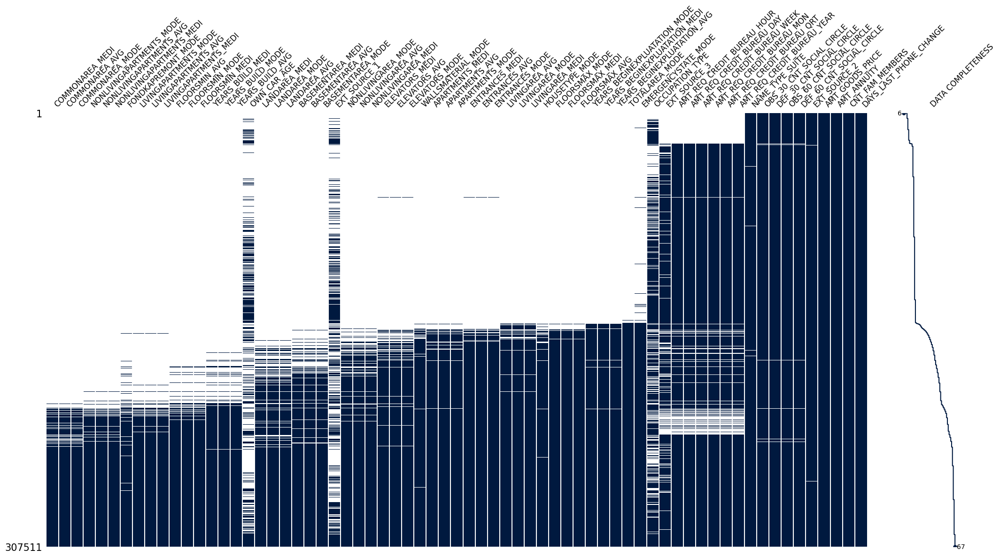

In [15]:
import missingno as missing
missing.matrix(df[index], color = (0, 0.1, 0.25),  sparkline=True, 
               figsize=(25,12), sort='ascending', fontsize=12, labels=True)

<Axes: >

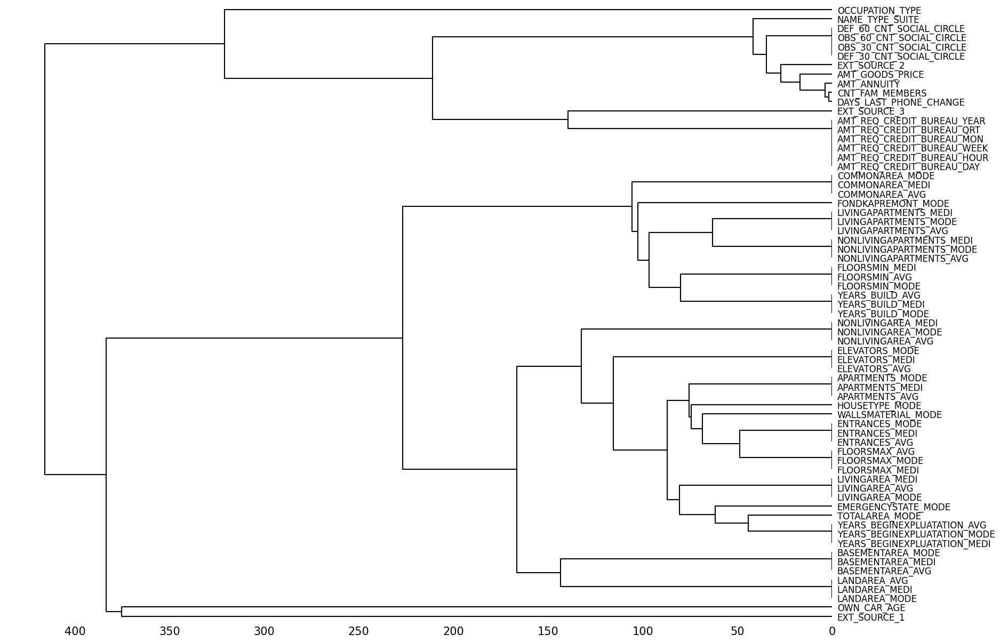

In [16]:
missing.dendrogram(df[index], fontsize=12, figsize=(20,15))

<code style="background:yellow;color:black">OBSERVATION:</code>

* the columns OCCUPATION_TYPE, EXT_SOURCE_1 and OWN_CAR_AGE missing data have very little relation with the other columns missing data

* #### OCCUPATION_TYPE

31% of missing data. For these, we are going to fill the null with the word 'Unknown'

In [242]:
df.OCCUPATION_TYPE.isna().sum() / df.shape[0]

0.31345545362604915

In [259]:
df.OCCUPATION_TYPE.value_counts()

OCCUPATION_TYPE
Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: count, dtype: int64

In [17]:
df.loc[df.OCCUPATION_TYPE.isna(), 'OCCUPATION_TYPE'] = 'Unknown'

* #### EXT_SOURCE_1 

56% of missing data.

Too much data missing. Therefore, this column will be drop from the model

In [273]:
df.EXT_SOURCE_1.isna().sum() / df.shape[0]

0.5638107254699832

In [272]:
df.EXT_SOURCE_1.describe()

count    134133.000000
mean          0.502130
std           0.211062
min           0.014568
25%           0.334007
50%           0.505998
75%           0.675053
max           0.962693
Name: EXT_SOURCE_1, dtype: float64

In [18]:
df.drop('EXT_SOURCE_1', axis=1, inplace=True)

* #### OWN_CAR_AGE

As said previously, in the column OWN_CAR_AGE, 5 people that own a car does not present the car´s age. 
For these, we are going to impute the median.

For the others that really does not own a car, we are going to impute using a very large number. Or maybe is better to categorize this variable

In [9]:
df.OWN_CAR_AGE.describe()

count    104582.000000
mean         12.061091
std          11.944812
min           0.000000
25%           5.000000
50%           9.000000
75%          15.000000
max          91.000000
Name: OWN_CAR_AGE, dtype: float64

In [19]:
df.loc[(df.OWN_CAR_AGE.isna() & df.FLAG_OWN_CAR == 1)  , 'OWN_CAR_AGE'] = df.OWN_CAR_AGE.median()
df.loc[(df.OWN_CAR_AGE.isna())  , 'OWN_CAR_AGE'] = -1

#### Testing if the complete rows present a difference to the incomplete ones

In [20]:
train = df.copy()

train['incomplete'] = 1
train.loc[train.isnull().sum(axis=1) < 47, 'incomplete'] = 0 # when there are less than 47 missing data on the row, we are consdering that the row in not incomplete

mean_c = np.mean(train.loc[train['incomplete'] == 0, 'TARGET'].values)
mean_i = np.mean(train.loc[train['incomplete'] == 1, 'TARGET'].values)
print('default ratio for more complete: {:.1%} \ndefault ratio for less complete: {:.1%}'.format(mean_c, mean_i))

default ratio for more complete: 7.0% 
default ratio for less complete: 9.3%


#### Chi-square test of independence of variables in a contingency table

In [21]:
from scipy.stats import chi2_contingency # https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.chi2_contingency.html

props = pd.crosstab(train.incomplete, train.TARGET)
c = chi2_contingency(props, lambda_="log-likelihood")
print("p-value= ", c[1])
props

p-value=  3.3312119000508636e-117


TARGET,0,1
incomplete,,
0,149814,11266
1,132872,13559


* The p-value is a number very low, so we can reject the null hypothesis (that complete and incomplete are igual).
* Therefore, using a significance level of 5%, we would reject the null hypothesis in favor of the alternative hypothesis:

<code style="background:yellow;color:black">OBSERVATION:</code>

* Considering the chi square test, there is a difference between the data that are complete to the incomplete one.
* Thus, we can proceed in two ways:
    1) divide the table into complete and incomplete and create a different model for each one
    2) do not consider the columns that have more than 40% missing data of the table because we could only assume that the missing values follows a mode, a median or a average (maybe a knn imputer) and it would not be the best approach.

In [22]:
train.incomplete.value_counts()

incomplete
0    161080
1    146431
Name: count, dtype: int64

In [23]:
remainder_columns, building_columns = [], []

for column in df.columns.values:
    if column.endswith("_AVG") or column.endswith("_MODE") or column.endswith("_MEDI"):
        building_columns.append(column)
    else:
        remainder_columns.append(column)

#### Create another column identifying the rows that are incomplete (considering only building info)

* More than half data have more than 33 columns with missing building info
* Only about 25% have all the building info presented

In [66]:
df[building_columns].isna().sum(axis=1).value_counts(normalize=True)\
                    .to_frame().reset_index().rename(columns={'index': 'sum_na'})\
                    .sort_values('sum_na', ascending=False)\
                    .set_index('sum_na').cumsum()

,proportion
sum_na,
47,0.473983
46,0.481729
45,0.483742
44,0.483875
43,0.483953
42,0.484984
41,0.485612
40,0.485892
39,0.492376


In [26]:
train.drop(columns = building_columns, axis=1, inplace=True)

## <code style="background:lightgray;color:green">4. EDA</code> 


### 4.1 Initial Analysis

#### Sweetviz

In [27]:
import sweetviz as sv

my_report = sv.analyze(train, 'TARGET')
my_report.show_html(filepath='SWEETVIZ_REPORT_HomeCredit.html')


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Feature: NAME_CONTRACT_TYPE                  |█▌                                       | [  4%]   00:03 -> (01:26 left)D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\sweetviz\from_profiling_pandas.py:65: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(keys):
Feature: CODE_GENDER                         |██▏                                      | [  5%]   00:04 -> (01:09 left)D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\sweetviz\from_profiling_pandas.py:65: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, Categoric

Report SWEETVIZ_REPORT_HomeCredit.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



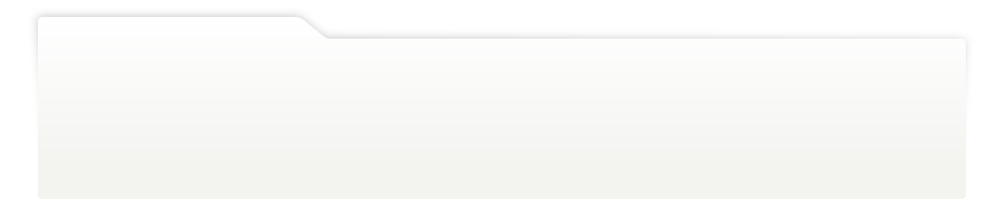
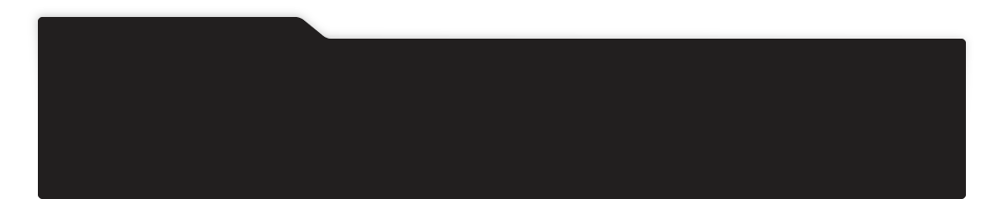
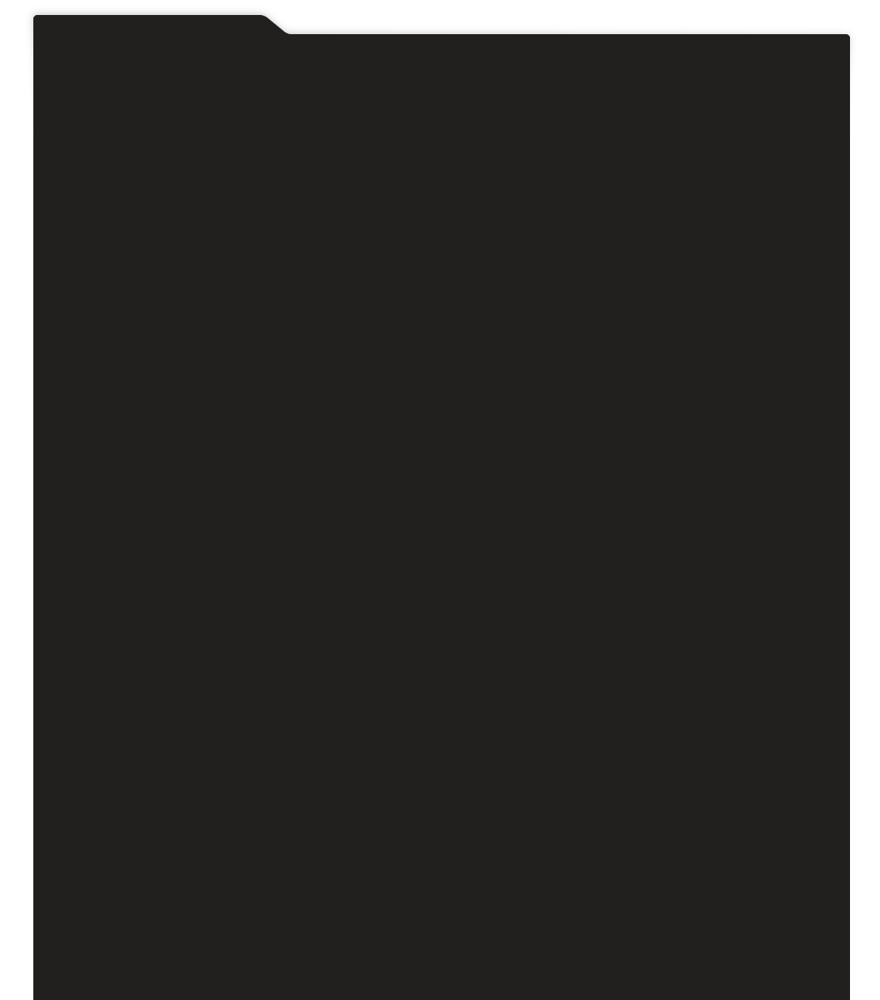
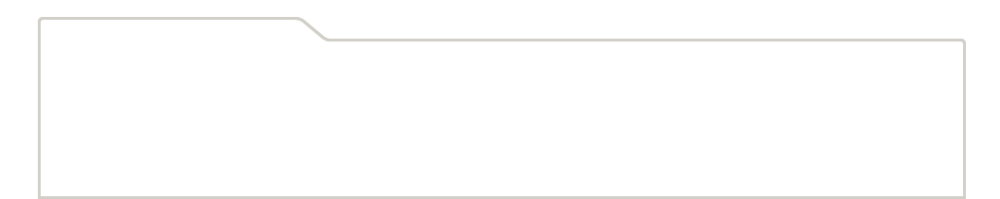
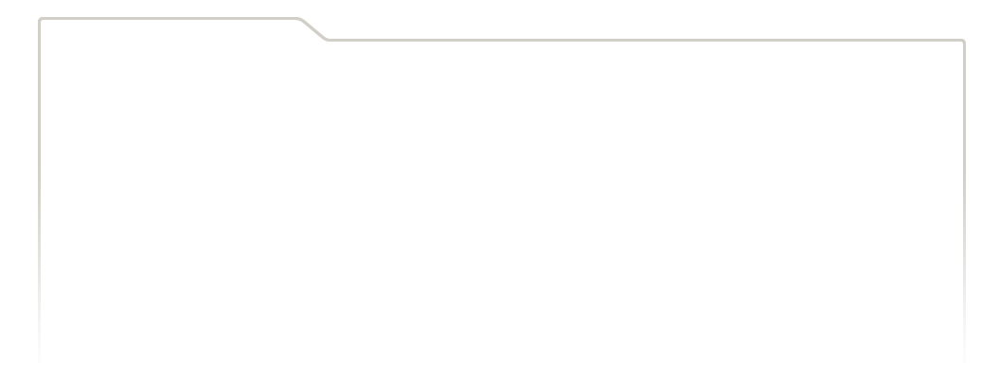
...
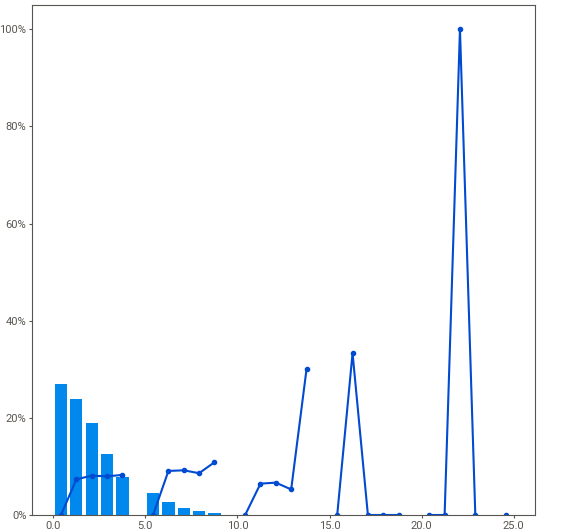
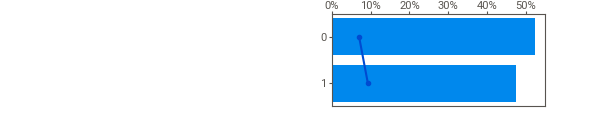
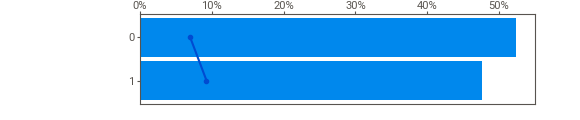
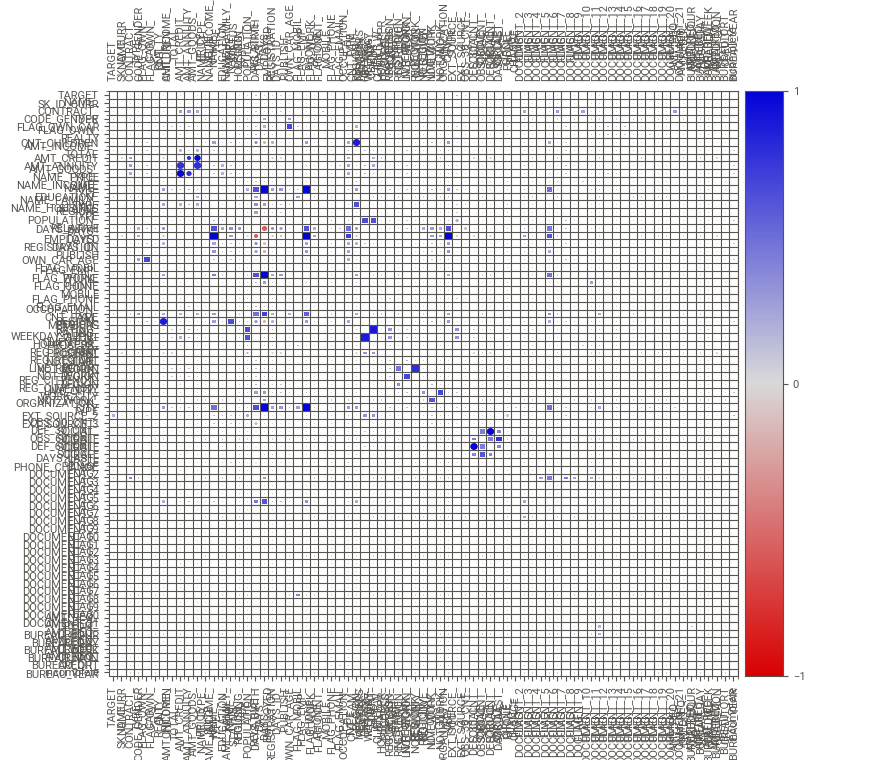
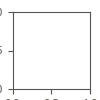

In [39]:
my_report.show_notebook()

Analysis:

* Only 8% of the data hava problems with payment
* 90% of the data are from cash loans and the remainder from the revolving
* Most part are women
* Only 34% have a car but 69% has its own realty
* Most people does not have children (70%)
* the median income is around 100 k while the credit is 500 k
* Most people have secondary education only


### 4.2. Correlation


* It can be observed that a few variables have a good correlation with each other but none of them have a significant correlation with the TARGET

In [28]:
# numerical features
num_features = df.select_dtypes(exclude='object').columns.values

In [29]:
num_features_analysis = [var for var in num_features if var not in building_columns ]

In [51]:
num_features_analysis.remove('SK_ID_CURR')

<Axes: >

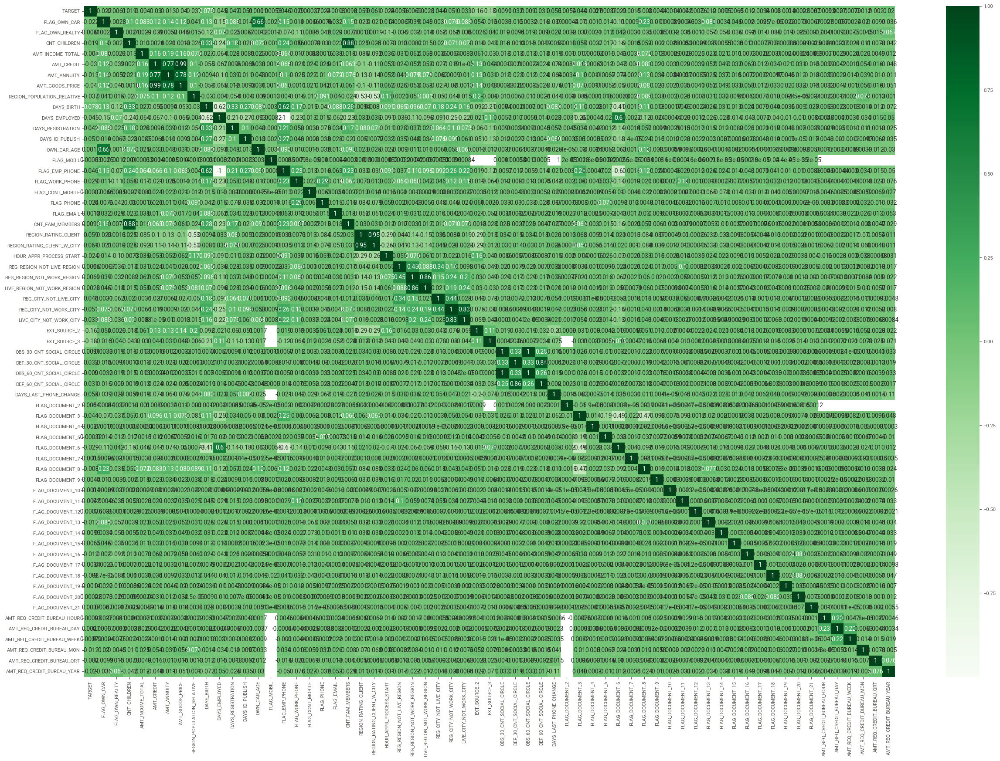

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(30, 20))
sns.heatmap(df[num_features_analysis].corr(), annot=True, cmap='Greens')

<Axes: >

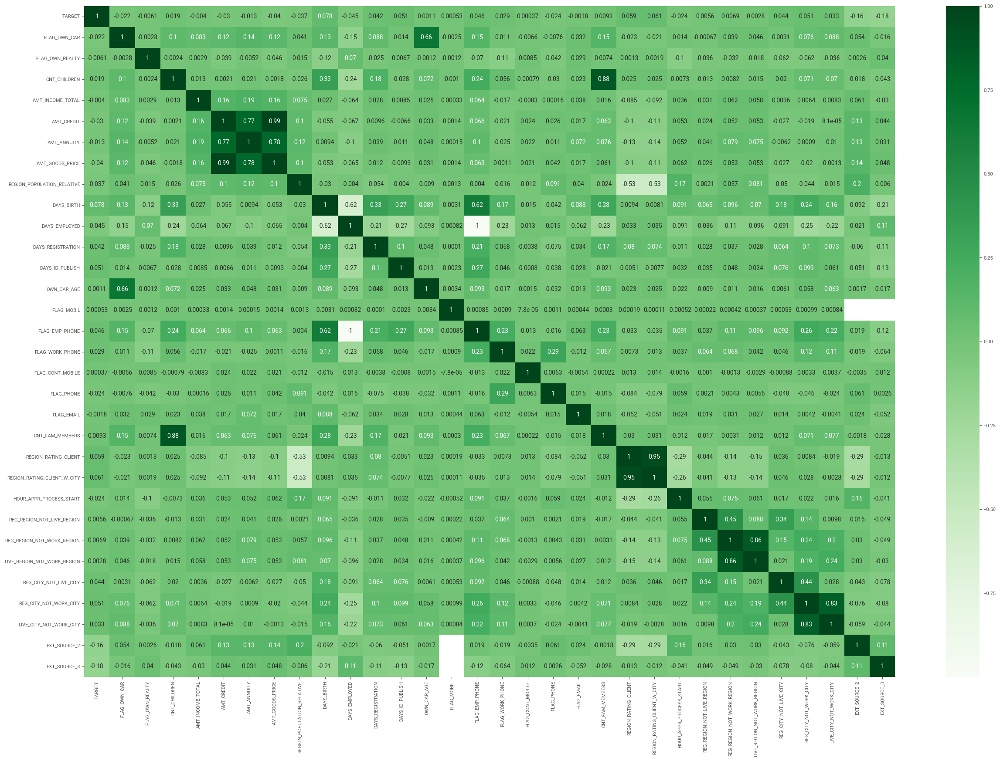

In [53]:
plt.figure(figsize=(30, 20))
sns.heatmap(df[num_features_analysis].iloc[:,:32].corr(), annot=True, cmap='Greens')


<Axes: >

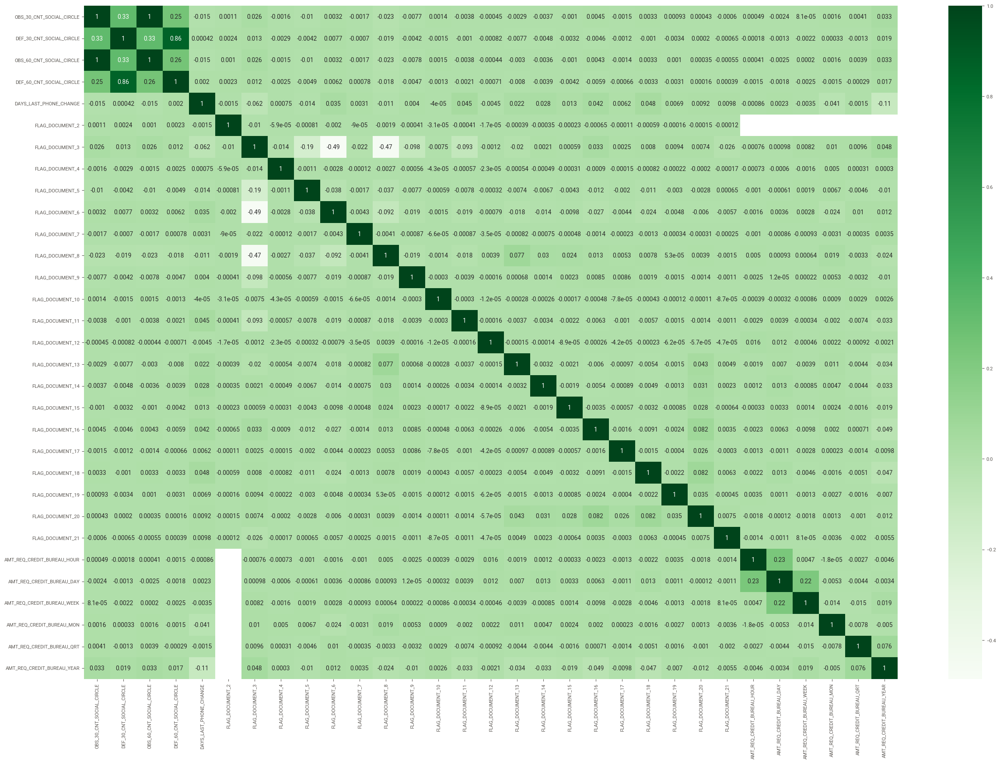

In [54]:
plt.figure(figsize=(30, 20))
sns.heatmap(df[num_features_analysis].iloc[:,32:].corr(), annot=True, cmap='Greens')

<Axes: >

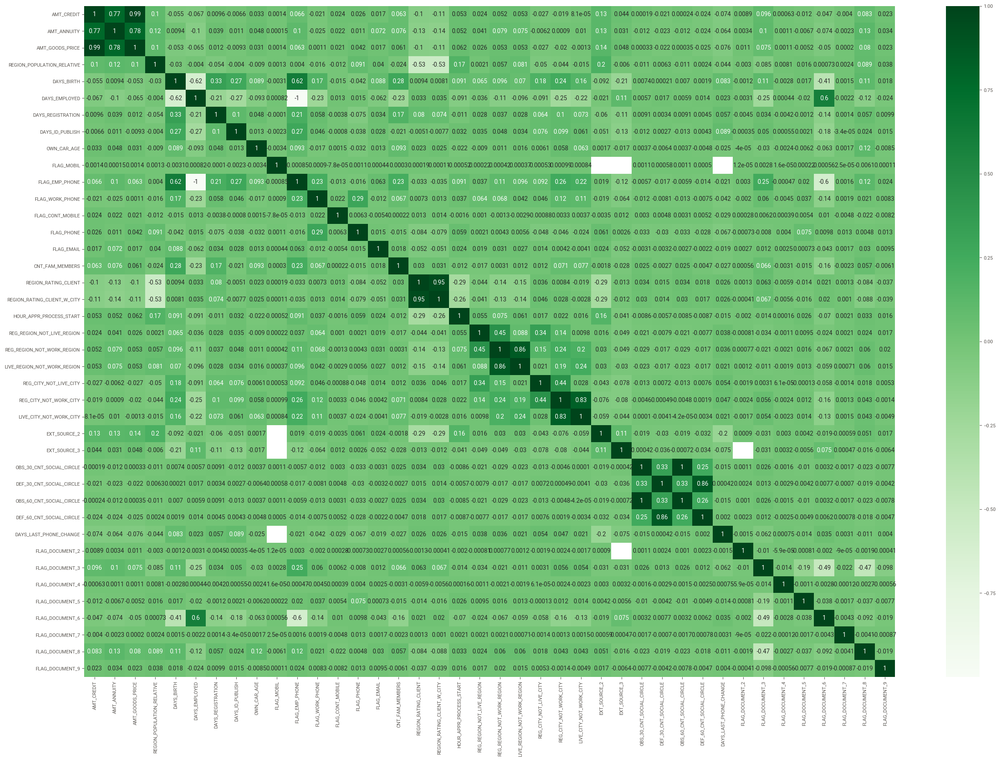

In [55]:
plt.figure(figsize=(30, 20))
sns.heatmap(df[num_features_analysis].iloc[:,5:45].corr(), annot=True, cmap='Greens')


In [56]:
correlation = df[num_features_analysis].corr()

* Analyzing the best correlations

In [57]:
corr_columns = set()
for line in correlation.iterrows():
    #print(line[0])
    indice = 0
    for i in line[1]:
        if abs(i) > 0.7 and i < 1.0:
            print(line[0], 'X' , correlation.index[indice], round(i,2))
            corr_columns.add(line[0])
            corr_columns.add(correlation.index[indice])
        indice += 1

CNT_CHILDREN X CNT_FAM_MEMBERS 0.88
AMT_CREDIT X AMT_ANNUITY 0.77
AMT_CREDIT X AMT_GOODS_PRICE 0.99
AMT_ANNUITY X AMT_CREDIT 0.77
AMT_ANNUITY X AMT_GOODS_PRICE 0.78
AMT_GOODS_PRICE X AMT_CREDIT 0.99
AMT_GOODS_PRICE X AMT_ANNUITY 0.78
DAYS_EMPLOYED X FLAG_EMP_PHONE -1.0
FLAG_EMP_PHONE X DAYS_EMPLOYED -1.0
CNT_FAM_MEMBERS X CNT_CHILDREN 0.88
REGION_RATING_CLIENT X REGION_RATING_CLIENT_W_CITY 0.95
REGION_RATING_CLIENT_W_CITY X REGION_RATING_CLIENT 0.95
REG_REGION_NOT_WORK_REGION X LIVE_REGION_NOT_WORK_REGION 0.86
LIVE_REGION_NOT_WORK_REGION X REG_REGION_NOT_WORK_REGION 0.86
REG_CITY_NOT_WORK_CITY X LIVE_CITY_NOT_WORK_CITY 0.83
LIVE_CITY_NOT_WORK_CITY X REG_CITY_NOT_WORK_CITY 0.83
OBS_30_CNT_SOCIAL_CIRCLE X OBS_60_CNT_SOCIAL_CIRCLE 1.0
DEF_30_CNT_SOCIAL_CIRCLE X DEF_60_CNT_SOCIAL_CIRCLE 0.86
OBS_60_CNT_SOCIAL_CIRCLE X OBS_30_CNT_SOCIAL_CIRCLE 1.0
DEF_60_CNT_SOCIAL_CIRCLE X DEF_30_CNT_SOCIAL_CIRCLE 0.86


In [58]:
corr_columns.add('TARGET')

<Axes: >

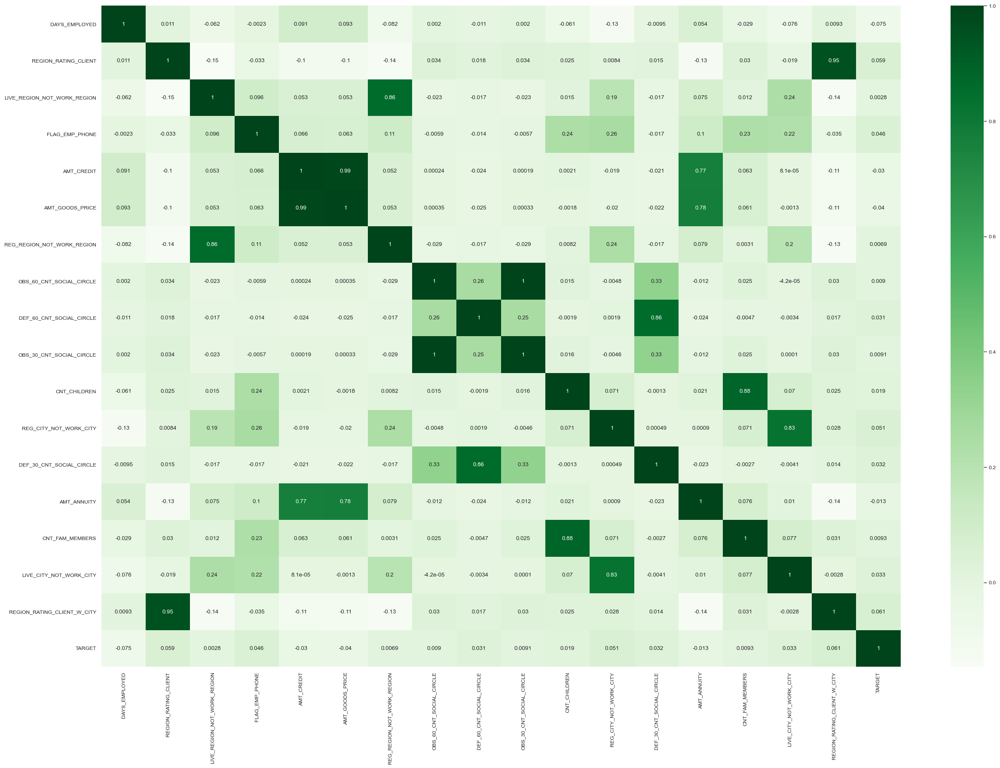

In [172]:
plt.figure(figsize=(30, 20))
sns.heatmap(df[list(corr_columns)].corr(), annot=True, cmap='Greens')

### 4.3. EXPLORATORY DATA ANALYSIS

#### Funções

In [69]:
from matplotlib.gridspec import GridSpec

def histograma_por_categoria(df, coluna_num, hue ='TARGET'):
      hue = hue
      fig = plt.figure(figsize=(17, 7))
      grid = GridSpec(nrows=2, ncols=1, figure=fig)

      ax0 = fig.add_subplot(grid[0, :])
      ax0.set_title('Histograma e Boxplot de {}'.format(coluna_num))
      sns.kdeplot(data=df, x=coluna_num, hue=hue, multiple="layer",
                fill=True, ax=ax0
                )
      ax0.set_xlim(left=-df[coluna_num].std(), right=df[coluna_num].max()+df[coluna_num].std())
      ax1 = fig.add_subplot(grid[1, :])
      #plt.axis('off')
      sns.boxplot(data=df, x = df[coluna_num], y = hue,
                      hue = hue,
                  orient="h",ax=ax1)
      ax1.set_xlim(left=-df[coluna_num].std(), right=df[coluna_num].max()+df[coluna_num].std())
      plt.show()


In [88]:
def descrite_plot_box(data, col_name, color = 'darkcyan', hue = None): 
    
    ax1 = sns.set_style(style=None, rc=None)
    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=data, ax = ax1, alpha=0.6) \
                 .set_title(col_name, fontsize=25) 
    ax1.set(xlabel=None)
    ax1.set_ylabel('Frequency', size=12)

    ax1.tick_params(axis='x', labelsize= 12)

    ax2 = ax1.twinx()
    paper_rc = {'lines.linewidth': 1}                  
    sns.set_context("paper", rc = paper_rc) 
    sns.pointplot(x=col_name, y='TARGET',
                  dodge=0.1, capsize=.15, data=data, ax = ax2,
                  ci='sd' # barra de erro com 1 desvio padrão para cada lado
                 ) 
    sns.boxplot(x=col_name,y="TARGET",data=data, ax = ax2)
    ax2.set_ylabel(col_name, size=12)
    ax2.tick_params(axis='y', labelsize= 12)

    plt.show()

### Numerical variables

#### 4.3.1. AMT_INCOME_TOTAL

* The income variable has a big skewness
* Most people have a annual income of 300 k or less

<code style="background:yellow;color:black">Possible transformations:</code>
* to categorical
* log

In [64]:
df[['AMT_INCOME_TOTAL']].describe()

,AMT_INCOME_TOTAL
count,3.075110e+05
mean,1.687979e+05
std,2.371231e+05
min,2.565000e+04
25%,1.125000e+05
50%,1.471500e+05
75%,2.025000e+05
max,1.170000e+08


C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\1034249404.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df.AMT_INCOME_TOTAL, hist=True)
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

<Axes: xlabel='AMT_INCOME_TOTAL', ylabel='Density'>

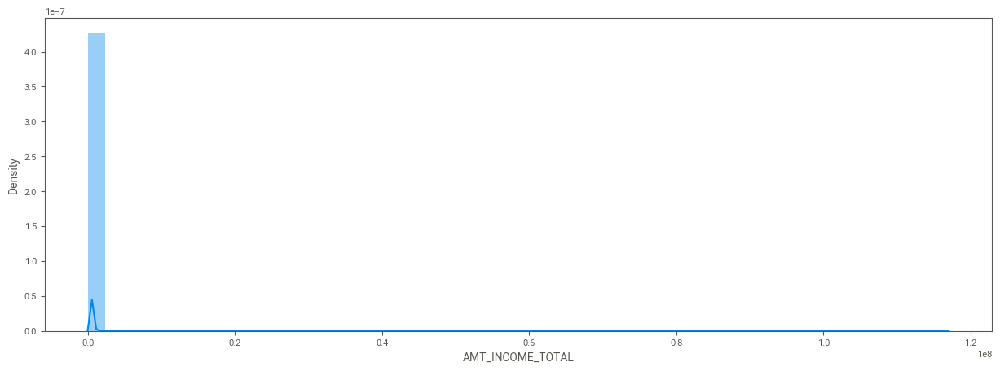

In [65]:
plt.figure(figsize=(15, 5))
sns.distplot(df.AMT_INCOME_TOTAL, hist=True)

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstan

<Axes: xlabel='AMT_INCOME_TOTAL', ylabel='TARGET'>

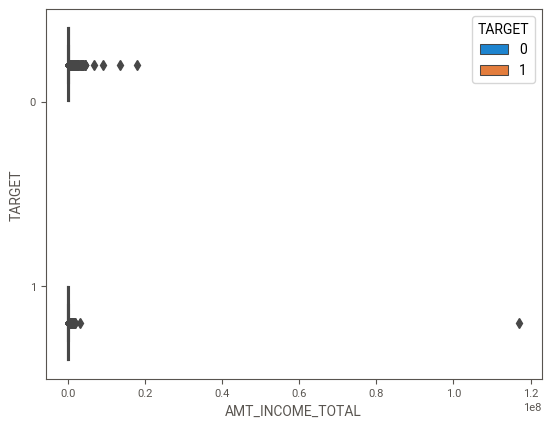

In [74]:
sns.boxplot(data=df, x = df['AMT_INCOME_TOTAL'], y = 'TARGET',
                      hue = 'TARGET',
                  orient="h")

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\563343407.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.log1p(df.AMT_INCOME_TOTAL), hist=True)
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before 

<Axes: xlabel='AMT_INCOME_TOTAL', ylabel='Density'>

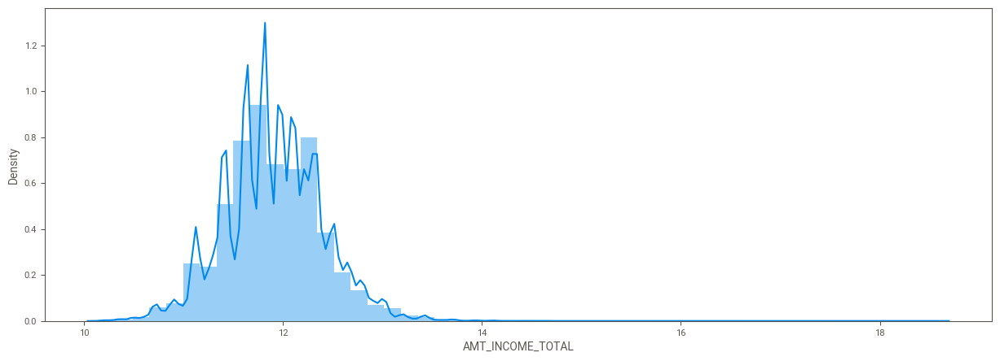

In [73]:
plt.figure(figsize=(15, 5))
sns.distplot(np.log1p(df.AMT_INCOME_TOTAL), hist=True)

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstan

<Axes: xlabel='AMT_INCOME_TOTAL', ylabel='TARGET'>

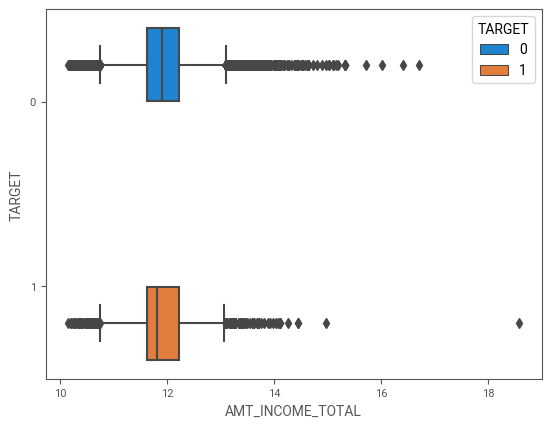

In [75]:
sns.boxplot(data=df, x = np.log1p(df['AMT_INCOME_TOTAL']), y = 'TARGET',
                      hue = 'TARGET',
                  orient="h")

#### 4.3.2. AMT_CREDIT

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstan

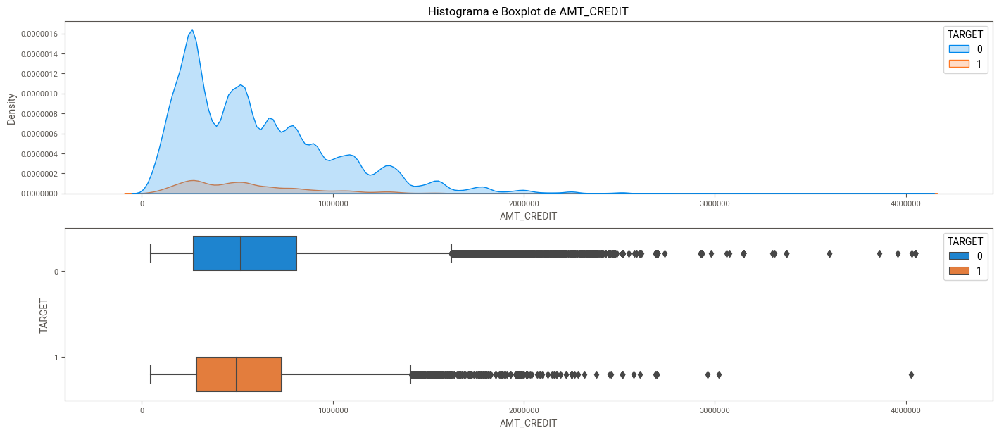

In [70]:
histograma_por_categoria(df, 'AMT_CREDIT', hue ='TARGET')

#### 4.3.3. AMT_ANNUITY

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstan

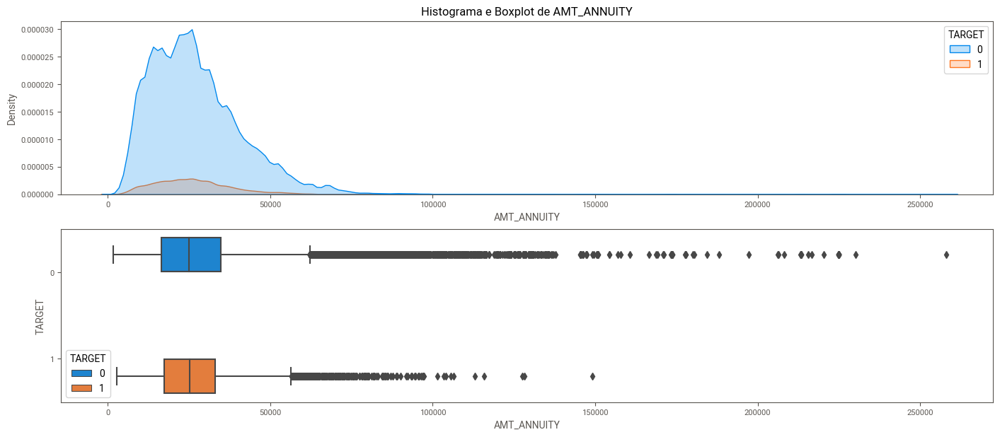

In [71]:
histograma_por_categoria(df, 'AMT_ANNUITY', hue ='TARGET')

#### 4.3.4. AMT_GOODS_PRICE

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstan

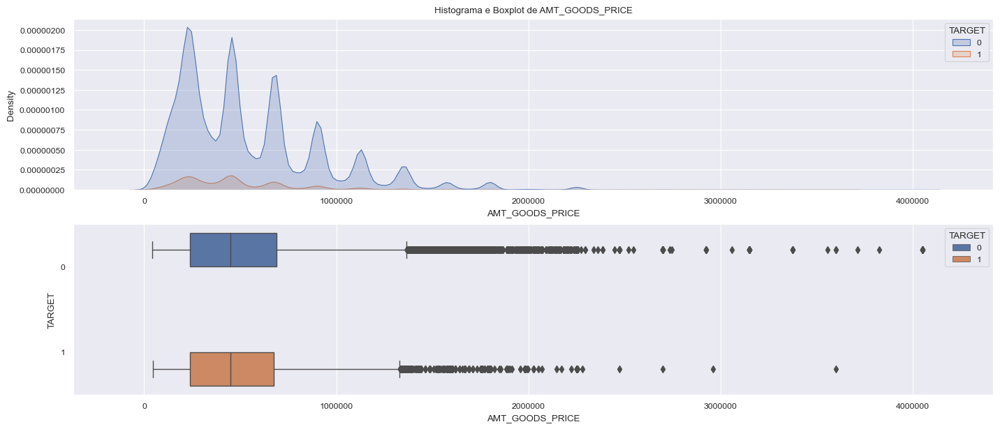

In [144]:
histograma_por_categoria(df, 'AMT_GOODS_PRICE', hue ='TARGET')

#### 4.3.5. DAYS_BIRTH

* This variable is negtive. We have to transform to be positive and in years
* People that have problems with the payment tends to be yonger (median smaller)

In [157]:
df.DAYS_BIRTH = - df.DAYS_BIRTH / 365

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstan

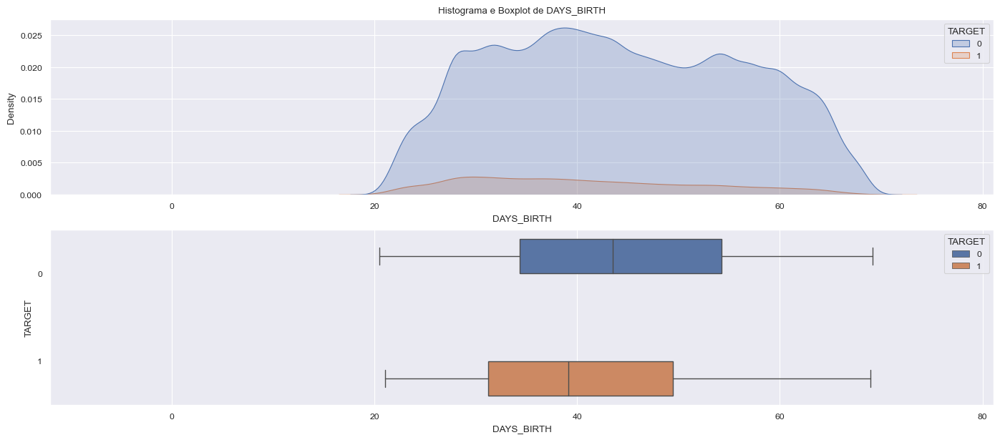

In [158]:
histograma_por_categoria(df, 'DAYS_BIRTH', hue ='TARGET')

#### DAYS_EMPLOYED

* Some anomalies can be seen as there are values higher than 300.000 days (~100 years). Therefore, this data needs to be corrected

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstan

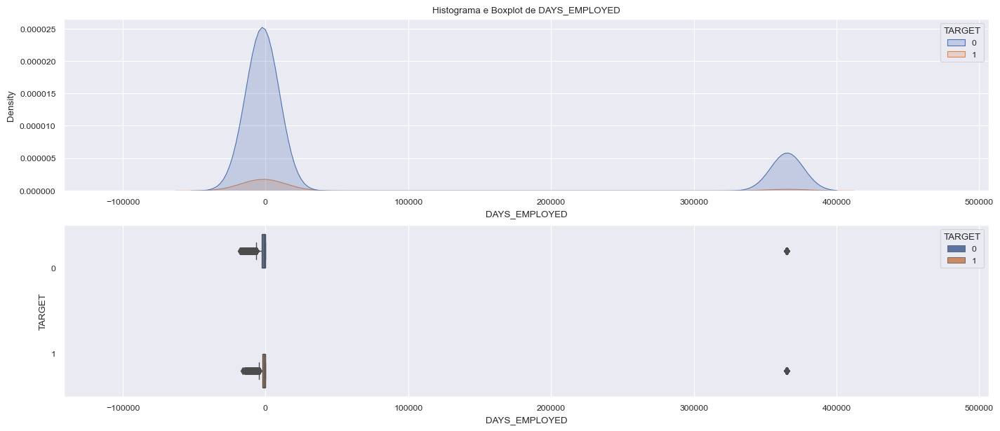

In [164]:
histograma_por_categoria(df, 'DAYS_EMPLOYED', hue ='TARGET')

In [166]:
df.DAYS_EMPLOYED.describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

In [167]:
df['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

In [169]:
df.DAYS_EMPLOYED = - df.DAYS_EMPLOYED / 365

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstan

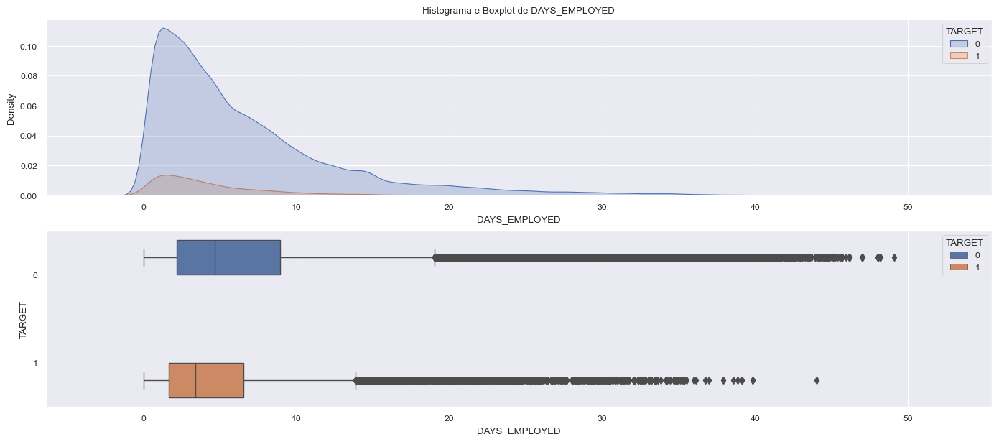

In [170]:
histograma_por_categoria(df, 'DAYS_EMPLOYED', hue ='TARGET')

#### 4.3.6. DAYS_REGISTRATION

In [159]:
df.DAYS_REGISTRATION = - df.DAYS_REGISTRATION / 365

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstan

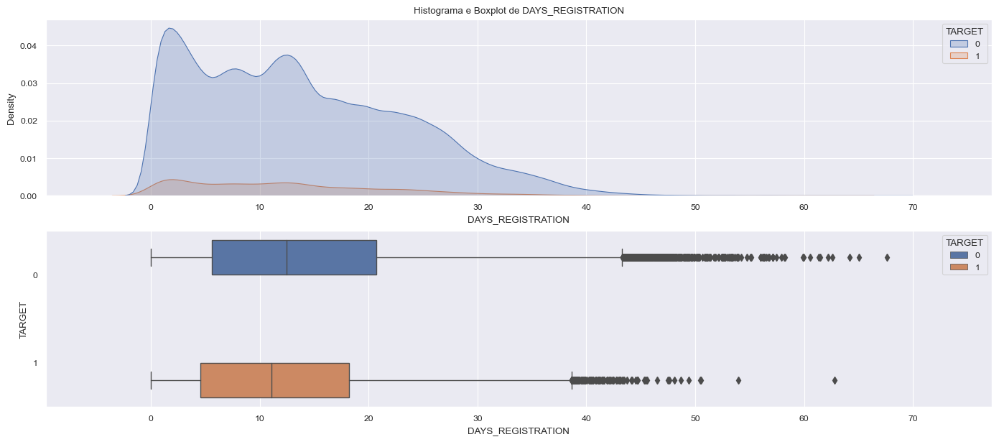

In [160]:
histograma_por_categoria(df, 'DAYS_REGISTRATION', hue ='TARGET')


#### 4.3.7. DAYS_ID_PUBLISH

In [161]:
df.DAYS_ID_PUBLISH = - df.DAYS_ID_PUBLISH / 365

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstan

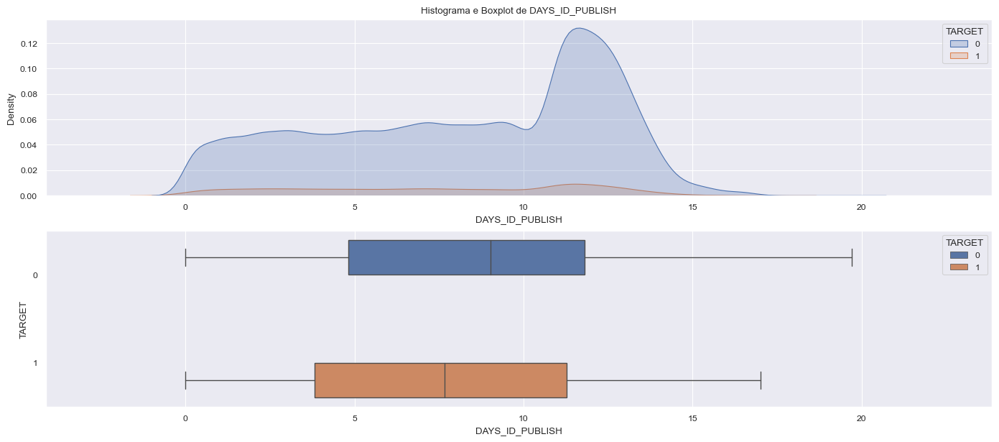

In [162]:
histograma_por_categoria(df, 'DAYS_ID_PUBLISH', hue ='TARGET')

#### 4.3.8. EXT_SOURCE_2

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstan

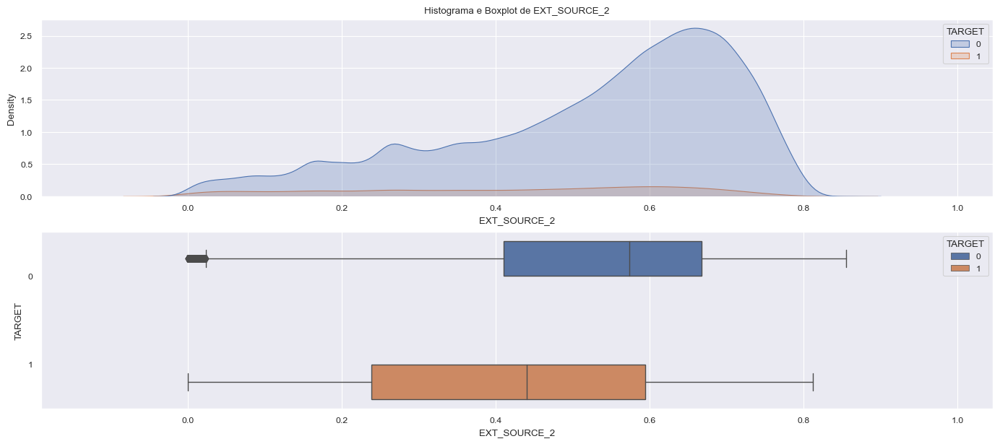

In [148]:
histograma_por_categoria(df, 'EXT_SOURCE_2', hue ='TARGET')

#### 4.3.9. EXT_SOURCE_3

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstan

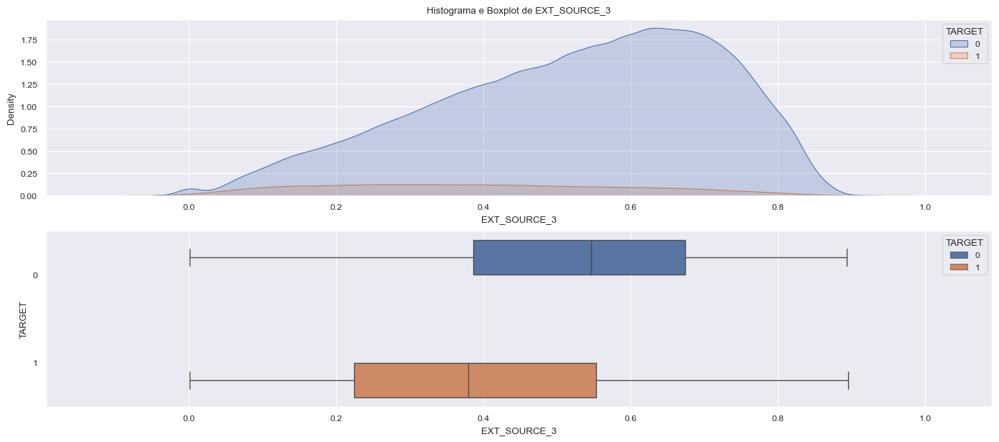

In [149]:
histograma_por_categoria(df, 'EXT_SOURCE_3', hue ='TARGET')

#### 4.3.10. HOUR_APPR_PROCESS_START

* This variable dos not seem to affect the TARGET. Thus, will be removed from the model

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

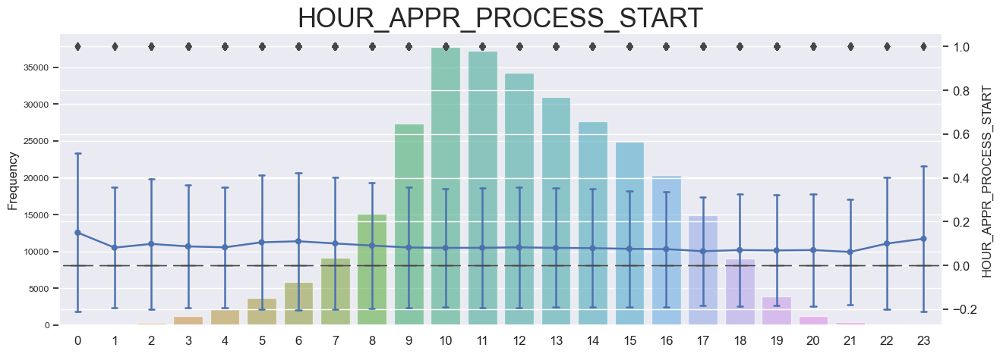

In [155]:
descrite_plot_box(df,'HOUR_APPR_PROCESS_START')

#### 4.3.11. CNT_CHILDREN

* There appears to be a difference when the number of children are 6 compared to less than 6.

<code style="background:yellow;color:black">Possible transformations:</code>
* to categorical

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\2369594275.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.point

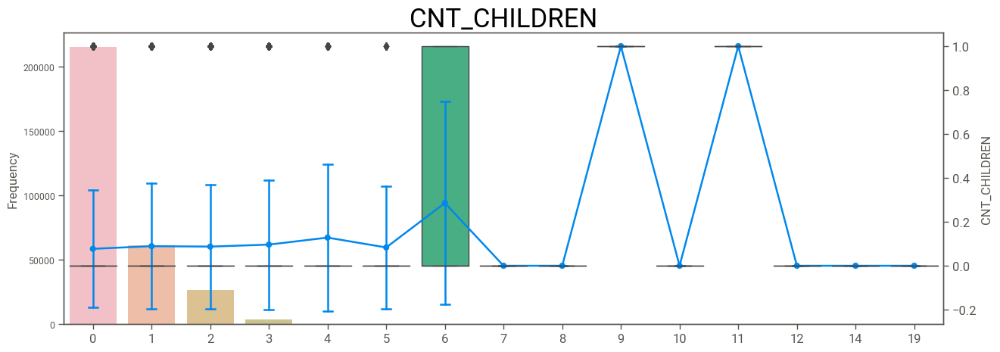

In [87]:
descrite_plot_box(df,'CNT_CHILDREN')

In [ ]:
df['MARRIED'] = df.CNT_FAM_MEMBERS - df.CNT_CHILDREN
df["MARRIED"] = df["MARRIED"].map(lambda x: 1 if x=2 else 0)

In [ ]:
df[df["MARRIED"] == 1].NAME_FAMILY_STATUS.value_counts()

In [198]:
#df.BIN_CHILDREN = np.where(df['CNT_CHILDREN'] > 0, 1, 0)
df =  df.assign(BIN_CHILDREN = lambda x: 1 if x.CNT_CHILDREN > 0 else 0)

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

#### 4.3.12. CNT_FAM_MEMBERS

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

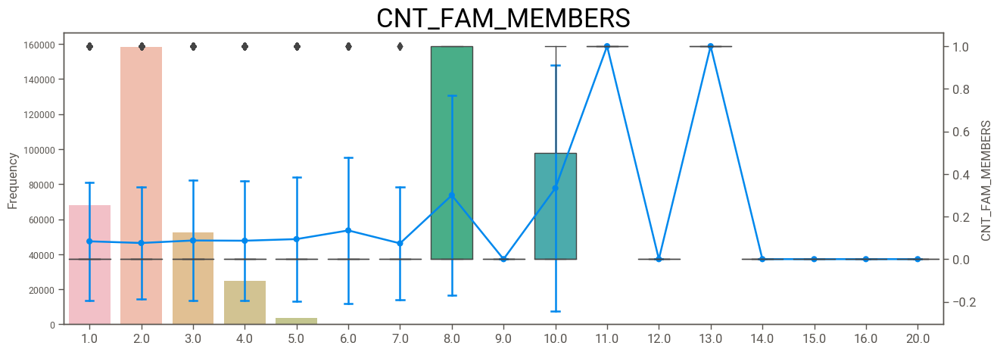

In [89]:
    
descrite_plot_box(df,'CNT_FAM_MEMBERS')

In [197]:

df =  df.assign(BIN_FAM_MEMBERS = lambda x: 1 if x.CNT_FAM_MEMBERS > 1 else 0)


ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

<Axes: xlabel='col_0', ylabel='row_0'>

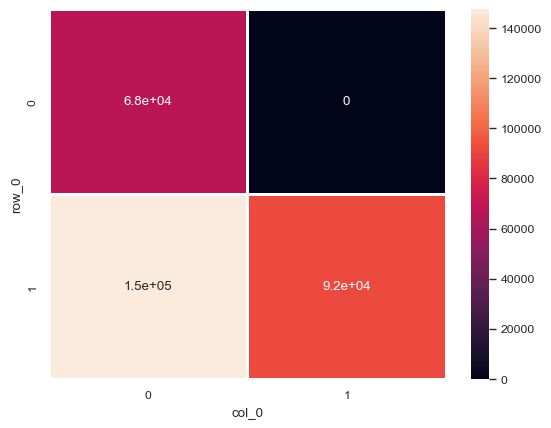

In [194]:
ctab = pd.crosstab(df.BIN_FAM_MEMBERS,
                   df.BIN_CHILDREN
                       
                       );

sns.heatmap(ctab,
                annot=True,
                #fmt='.2%',
                
                linewidths=1)

#### 4.3.13. OWN_CAR_AGE

* There seems to be some outliers

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

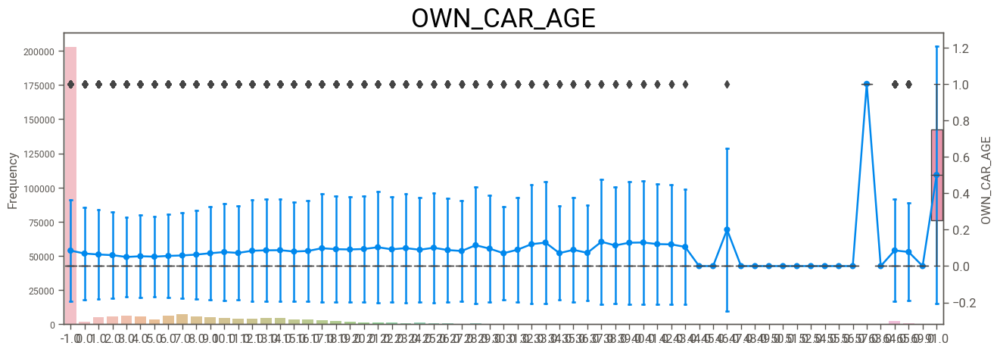

In [90]:
descrite_plot_box(df,'OWN_CAR_AGE')

#### 3.3.14. AMT_REQ_CREDIT_

In [139]:
 col_AMT_REQ = ['AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
               'TARGET']

D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstan

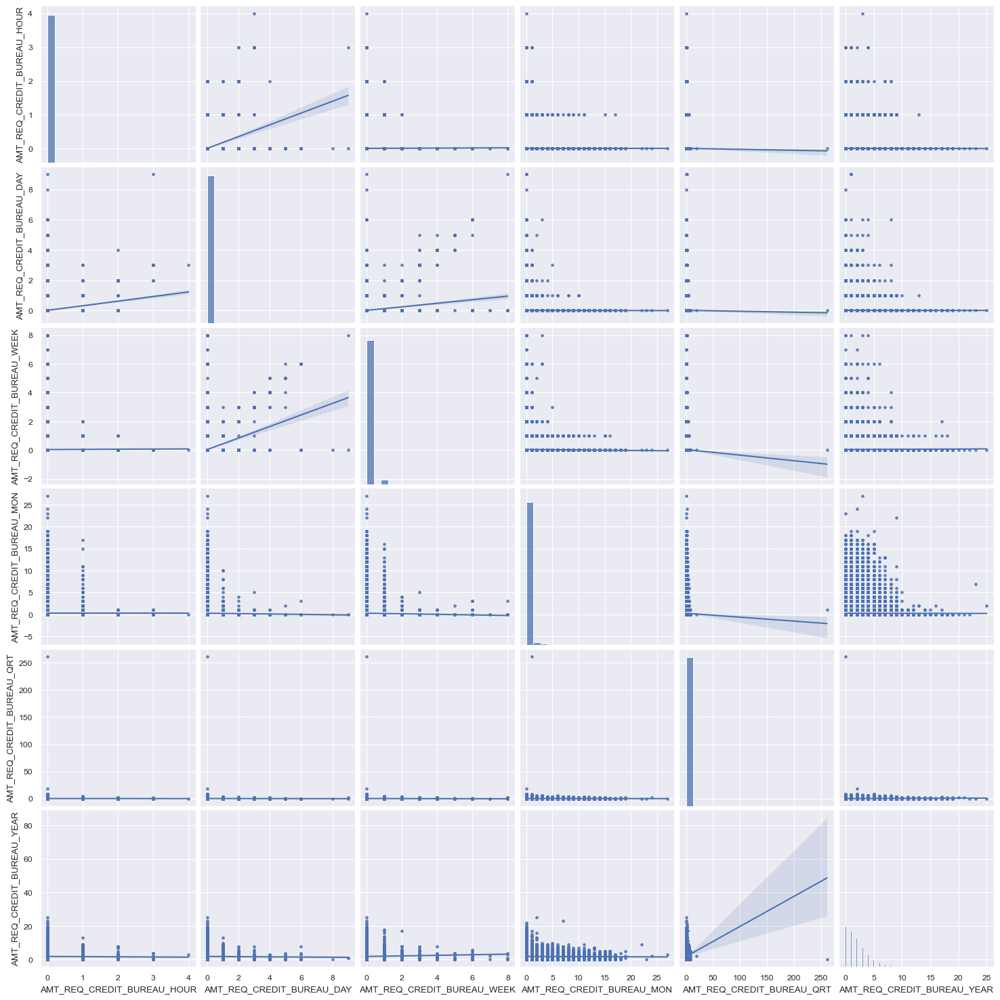

In [143]:
sns.pairplot(df[col_AMT_REQ],
             kind = 'reg',
             
             markers = '.',)

### 4.3.14. Binary variables

* FLAG_DOCUMENT_2 have only 13 with the value 1, the rest are 0. Therefore, this variable will be removed from our model
* FLAG_DOCUMENT_10 have only 7 with the value 1, the rest are 0. Therefore, this variable will be removed from our model
* FLAG_DOCUMENT_12 have only 2 with the value 1, the rest are 0. Therefore, this variable will be removed from our model

In [120]:
bin_columns = [  'FLAG_OWN_CAR',
                 'FLAG_OWN_REALTY',
                 'FLAG_MOBIL',
                 'FLAG_EMP_PHONE',
                 'FLAG_WORK_PHONE',
                 'FLAG_CONT_MOBILE',
                 'FLAG_PHONE',
                 'FLAG_EMAIL', 
                 'REGION_RATING_CLIENT',
                 'REGION_RATING_CLIENT_W_CITY',                 
                 'REG_REGION_NOT_LIVE_REGION',
                 'REG_REGION_NOT_WORK_REGION',
                 'LIVE_REGION_NOT_WORK_REGION',
                 'REG_CITY_NOT_LIVE_CITY',
                 'REG_CITY_NOT_WORK_CITY',
                 'LIVE_CITY_NOT_WORK_CITY',
                 'FLAG_DOCUMENT_2',
                 'FLAG_DOCUMENT_3',
                 'FLAG_DOCUMENT_4',
                 'FLAG_DOCUMENT_5',
                 'FLAG_DOCUMENT_6',
                 'FLAG_DOCUMENT_7',
                 'FLAG_DOCUMENT_8',
                 'FLAG_DOCUMENT_9',
                 'FLAG_DOCUMENT_10',
                 'FLAG_DOCUMENT_11',
                 'FLAG_DOCUMENT_12',
                 'FLAG_DOCUMENT_13',
                 'FLAG_DOCUMENT_14',
                 'FLAG_DOCUMENT_15',
                 'FLAG_DOCUMENT_16',
                 'FLAG_DOCUMENT_17',
                 'FLAG_DOCUMENT_18',
                 'FLAG_DOCUMENT_19',
                 'FLAG_DOCUMENT_20',
                 'FLAG_DOCUMENT_21']

========== FLAG_OWN_CAR ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

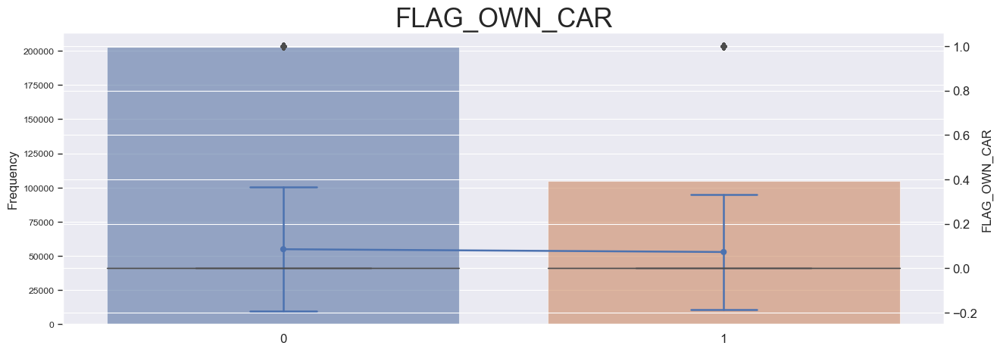

========== FLAG_OWN_REALTY ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

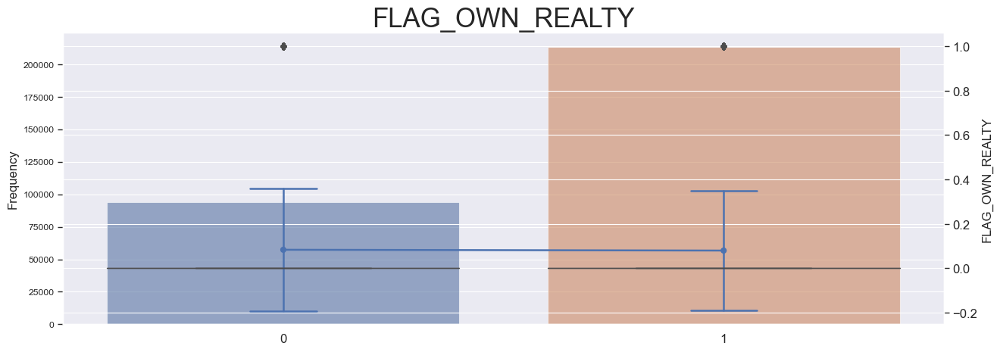

========== FLAG_MOBIL ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

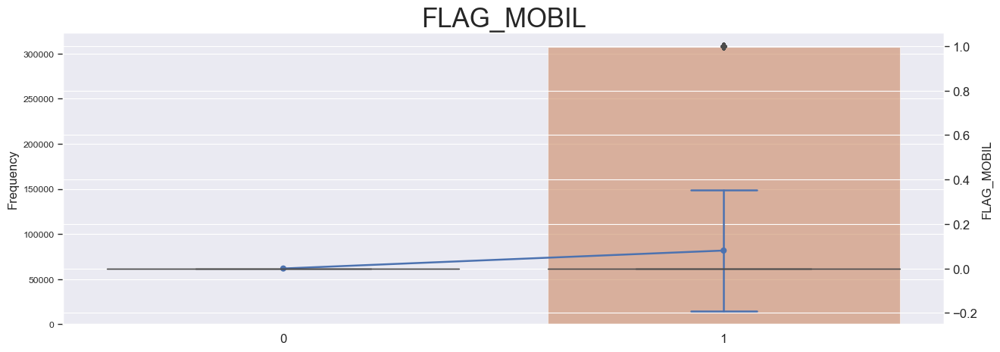

========== FLAG_EMP_PHONE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

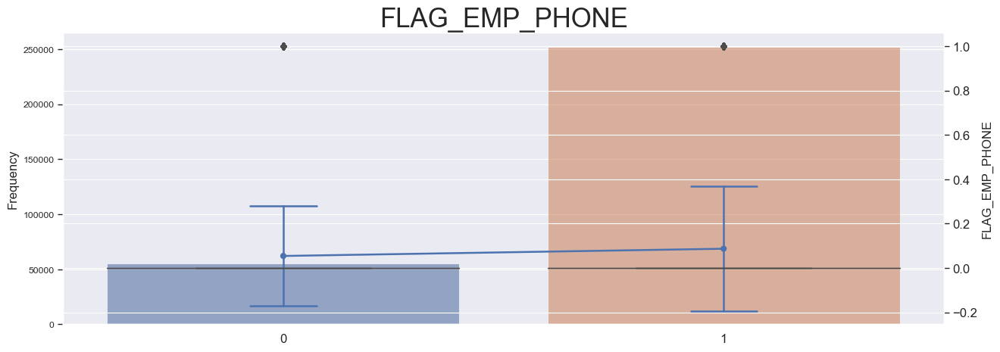

========== FLAG_WORK_PHONE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

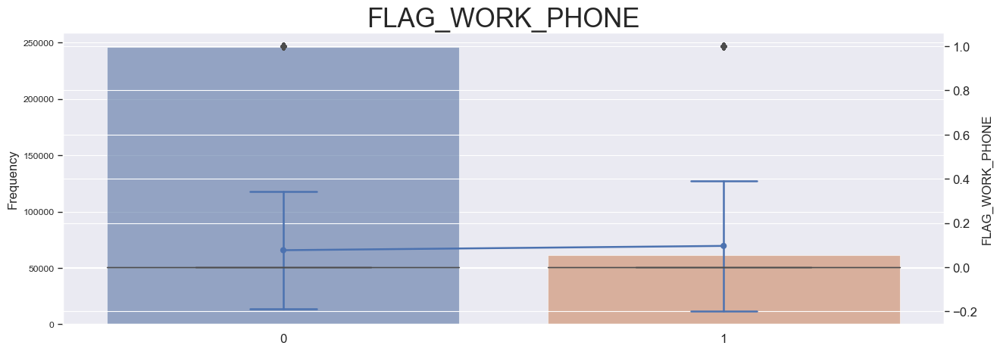

========== FLAG_CONT_MOBILE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

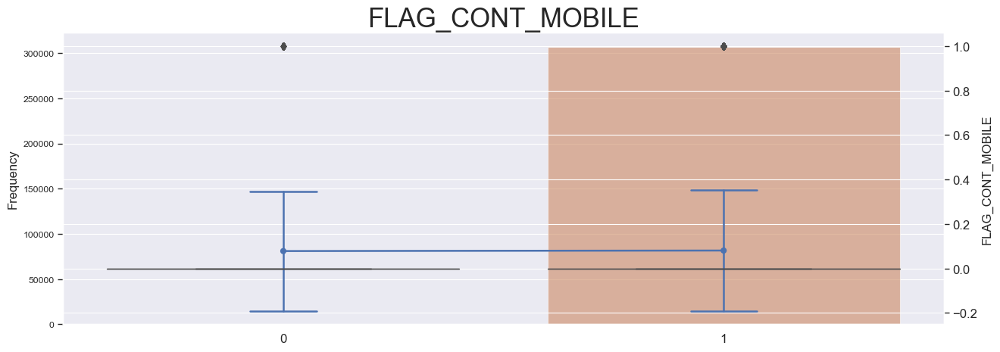

========== FLAG_PHONE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

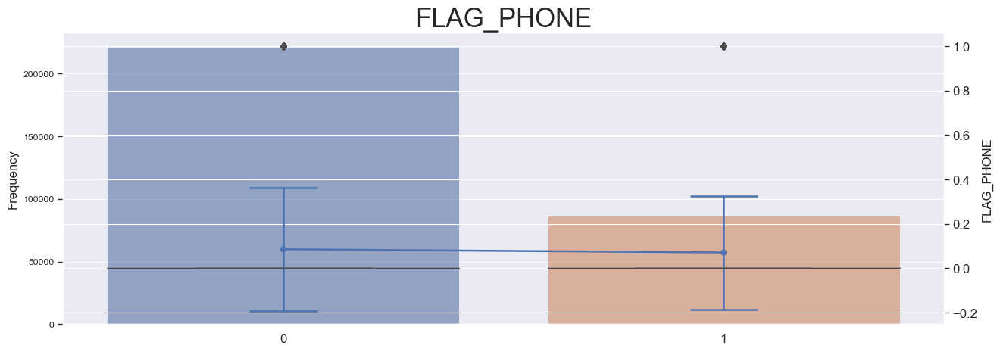

========== FLAG_EMAIL ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

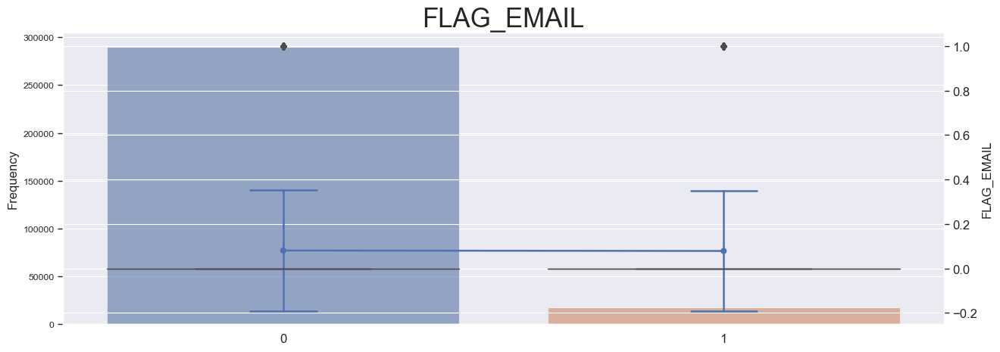

========== REGION_RATING_CLIENT ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

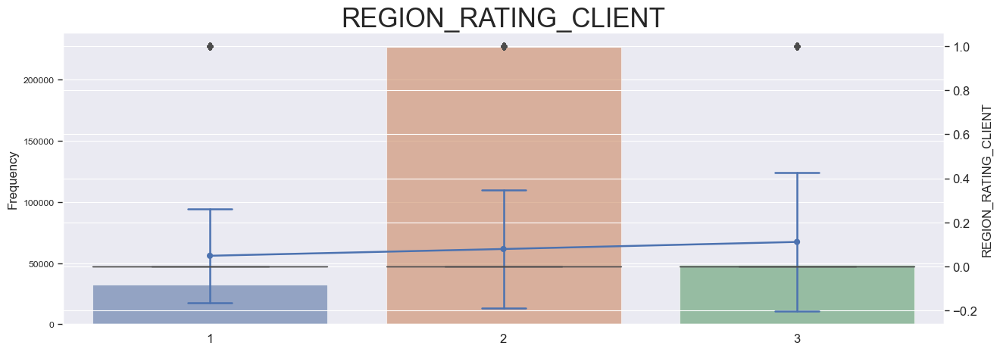

========== REGION_RATING_CLIENT_W_CITY ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

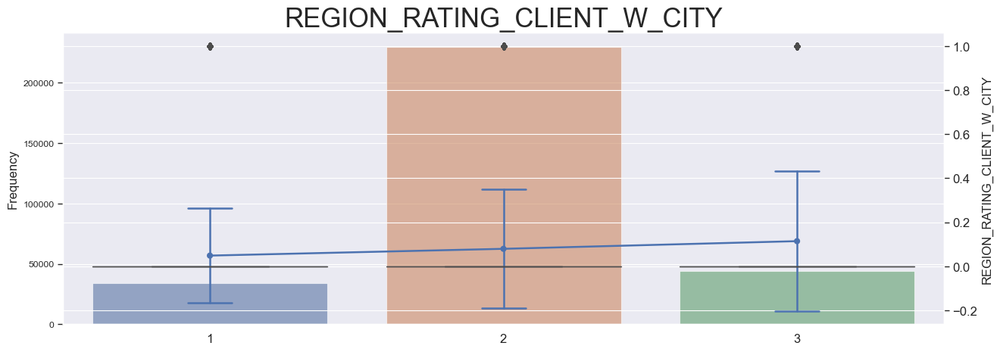

========== REG_REGION_NOT_LIVE_REGION ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

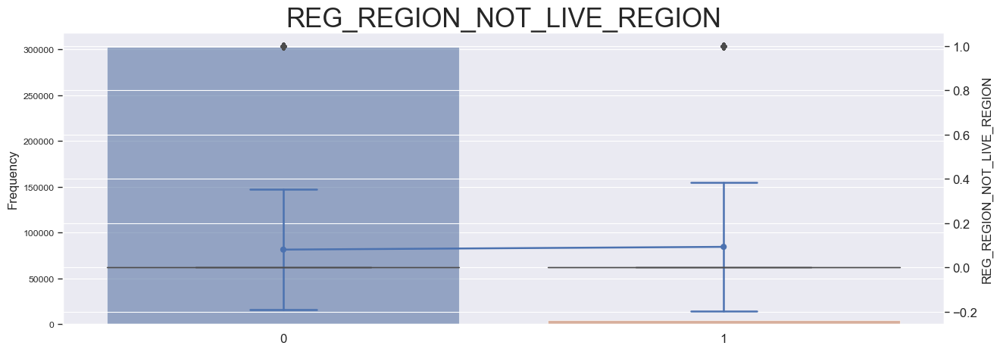

========== REG_REGION_NOT_WORK_REGION ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

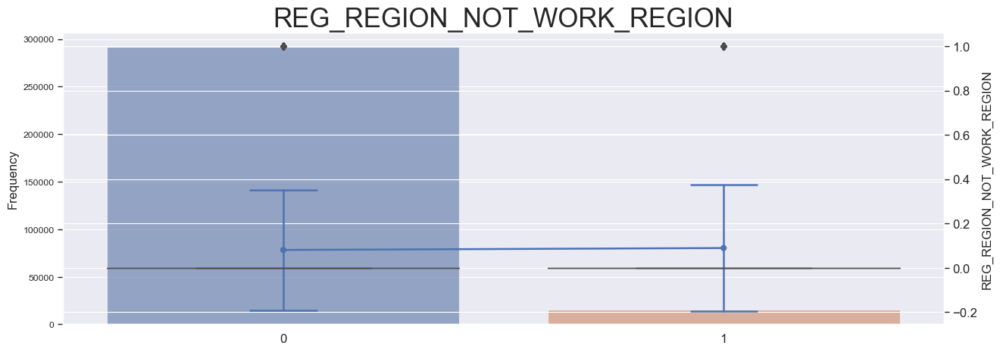

========== LIVE_REGION_NOT_WORK_REGION ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

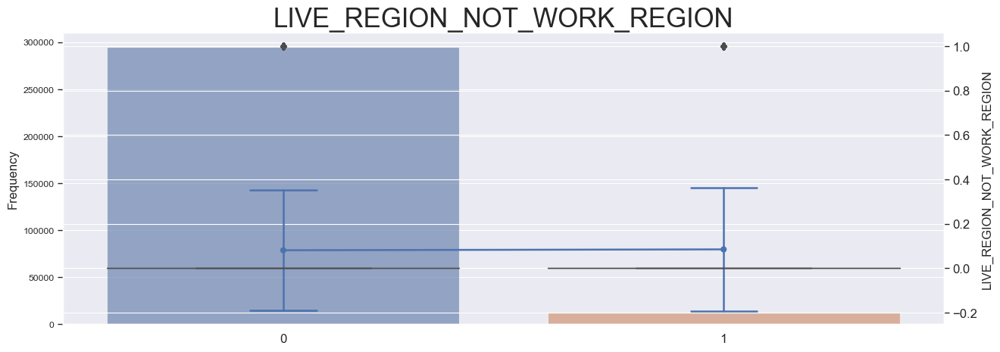

========== REG_CITY_NOT_LIVE_CITY ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

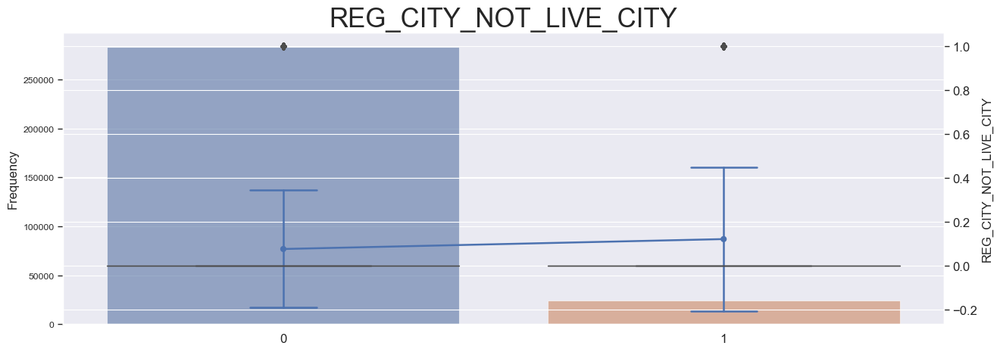

========== REG_CITY_NOT_WORK_CITY ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

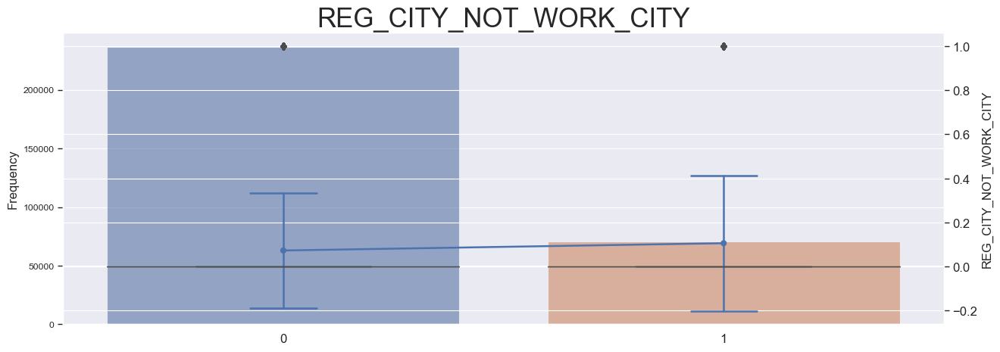

========== LIVE_CITY_NOT_WORK_CITY ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

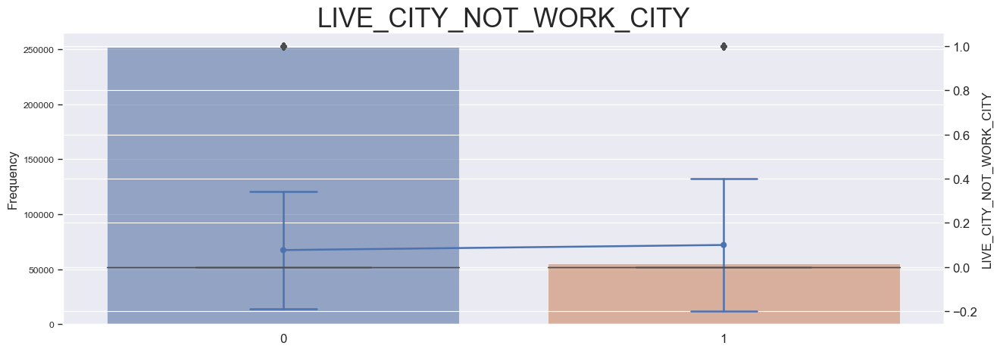

========== FLAG_DOCUMENT_2 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

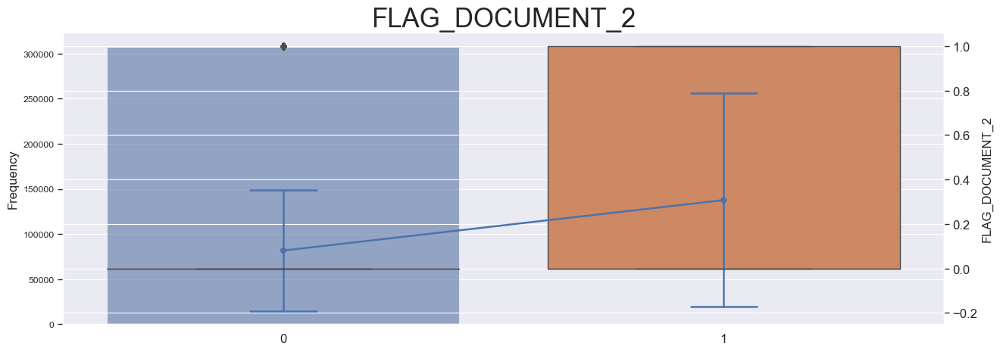

========== FLAG_DOCUMENT_3 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

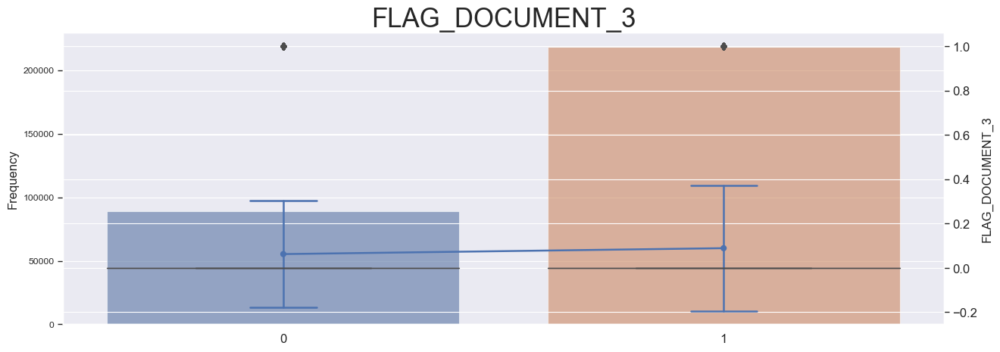

========== FLAG_DOCUMENT_4 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

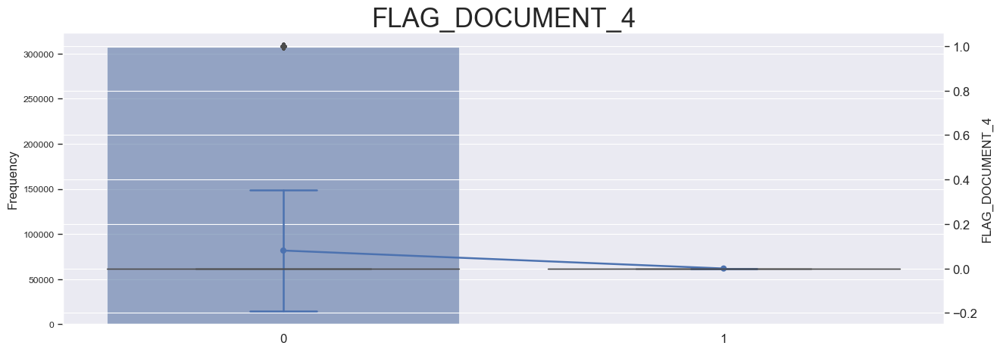

========== FLAG_DOCUMENT_5 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

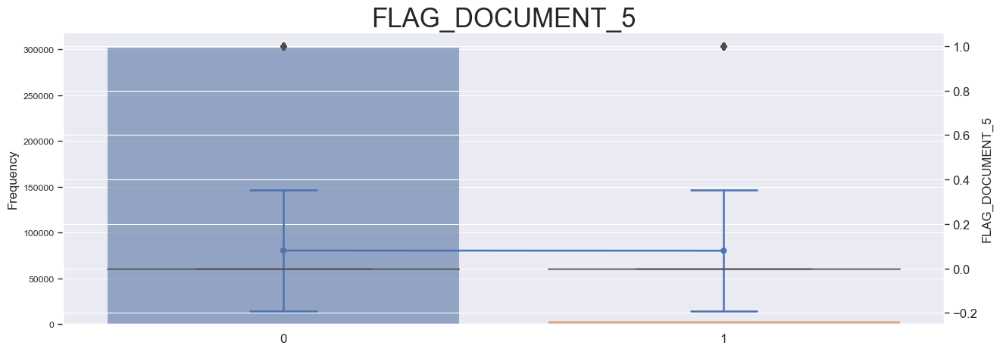

========== FLAG_DOCUMENT_6 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

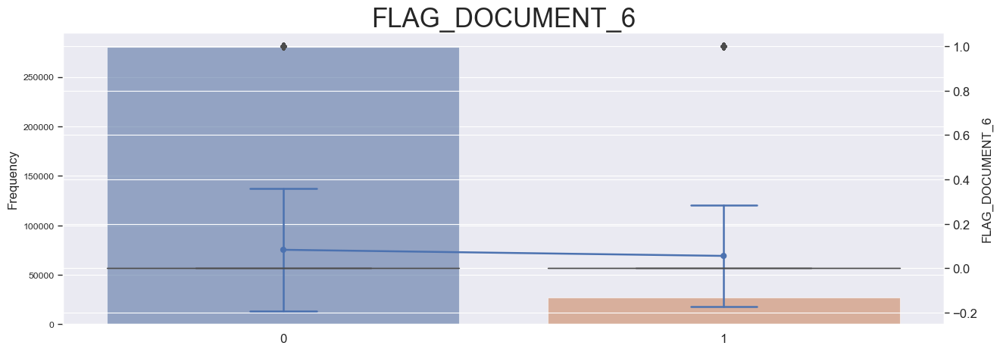

========== FLAG_DOCUMENT_7 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

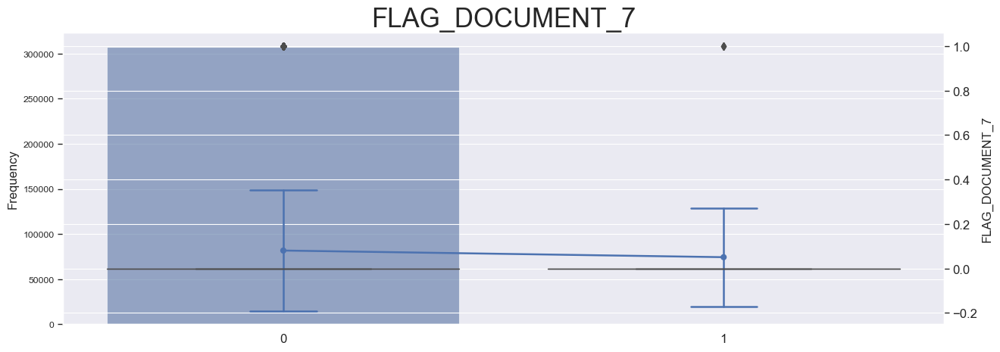

========== FLAG_DOCUMENT_8 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

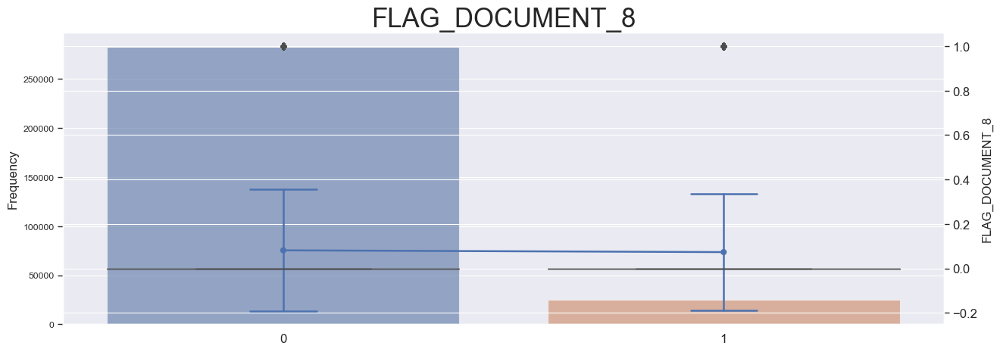

========== FLAG_DOCUMENT_9 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

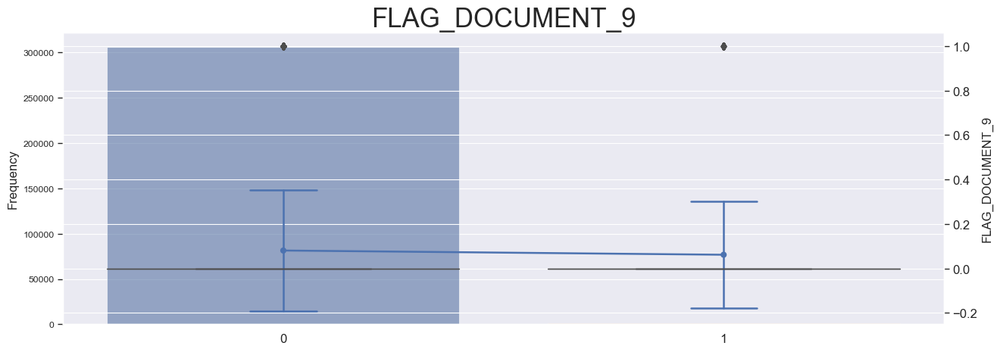

========== FLAG_DOCUMENT_10 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

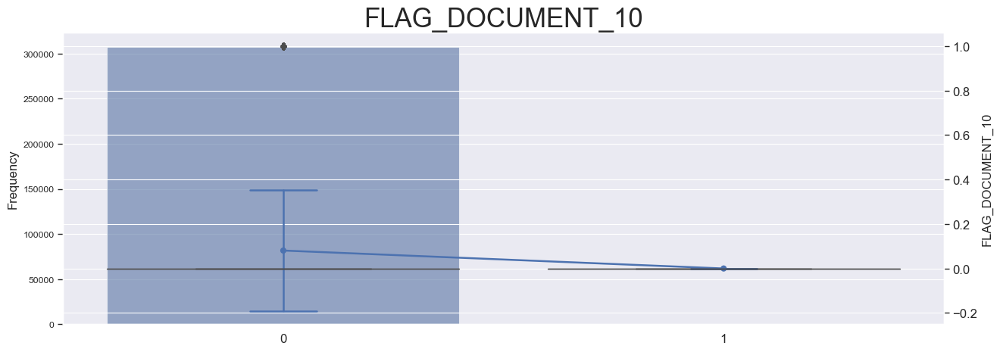

========== FLAG_DOCUMENT_11 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

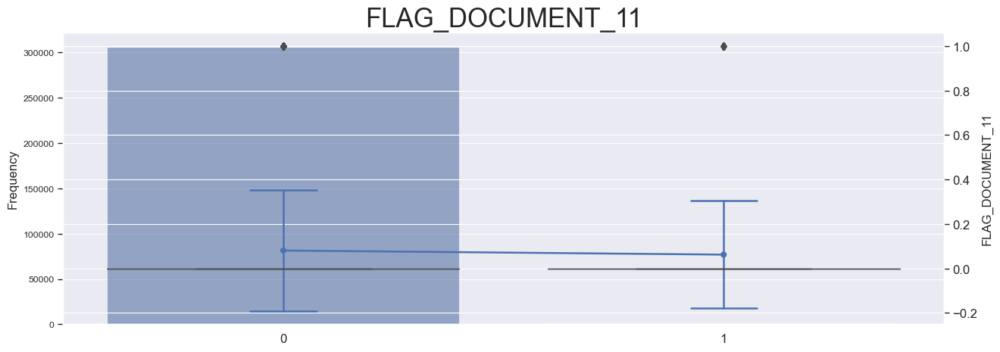

========== FLAG_DOCUMENT_12 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

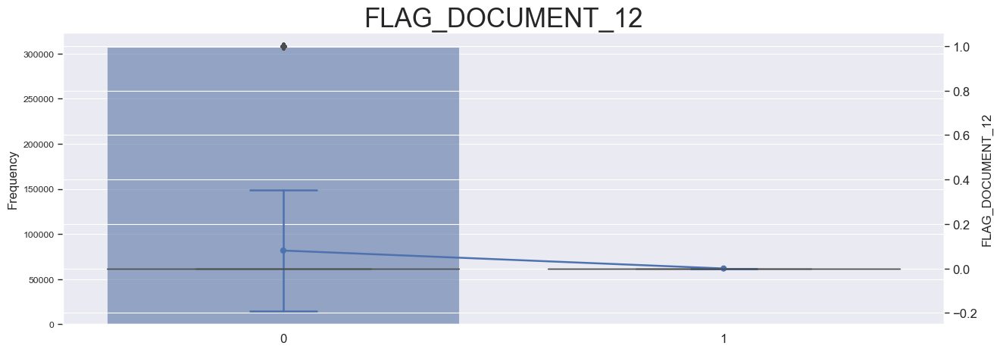

========== FLAG_DOCUMENT_13 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

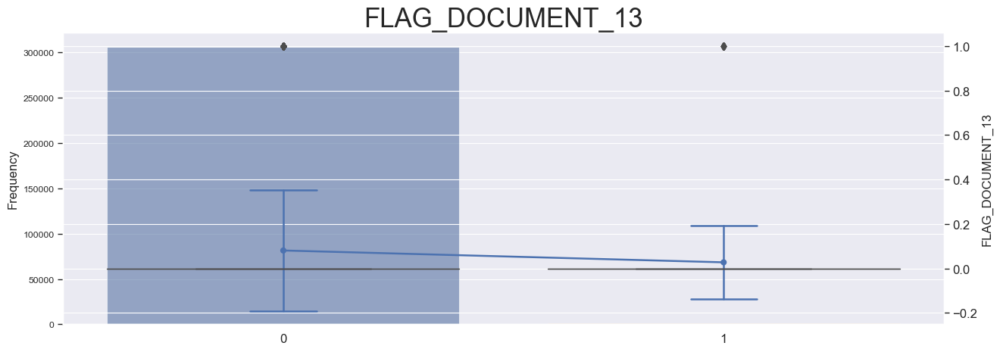

========== FLAG_DOCUMENT_14 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

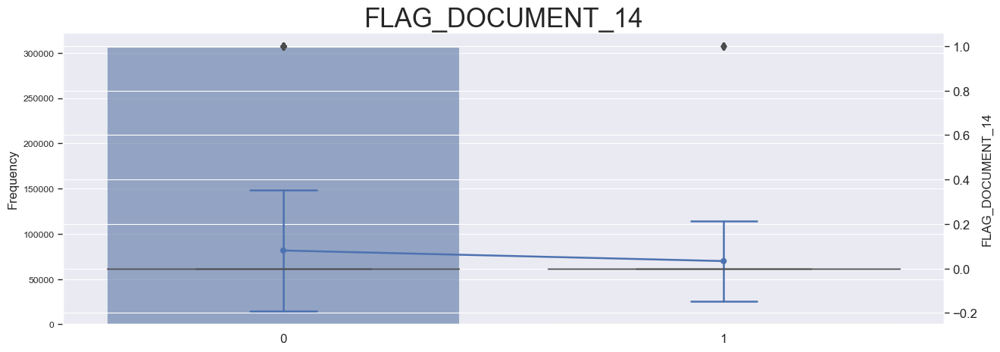

========== FLAG_DOCUMENT_15 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

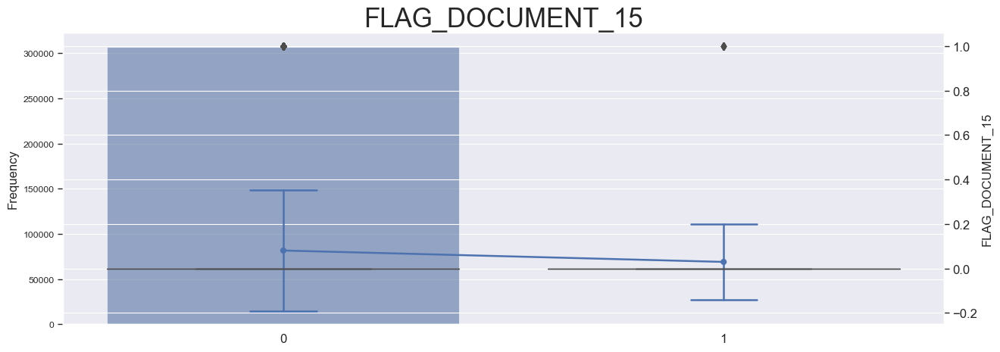

========== FLAG_DOCUMENT_16 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

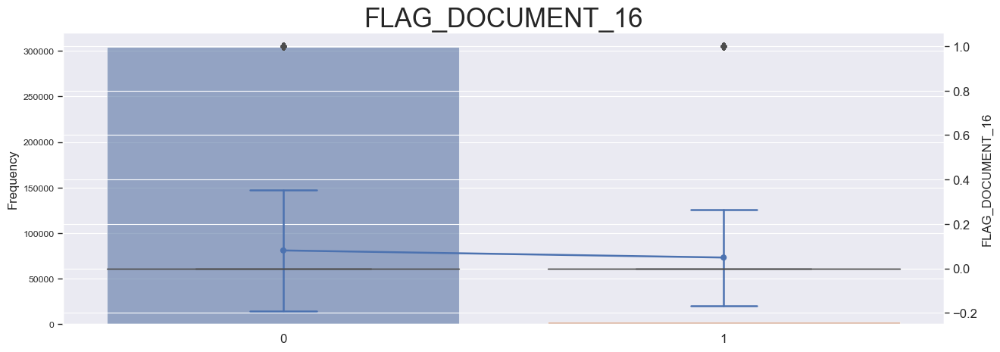

========== FLAG_DOCUMENT_17 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

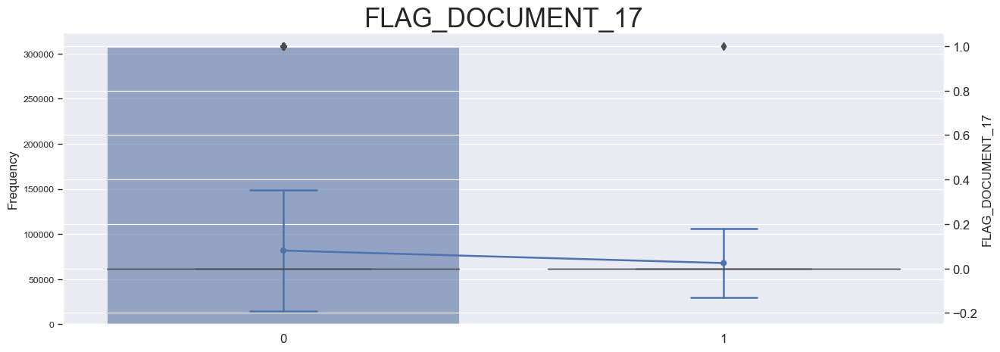

========== FLAG_DOCUMENT_18 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

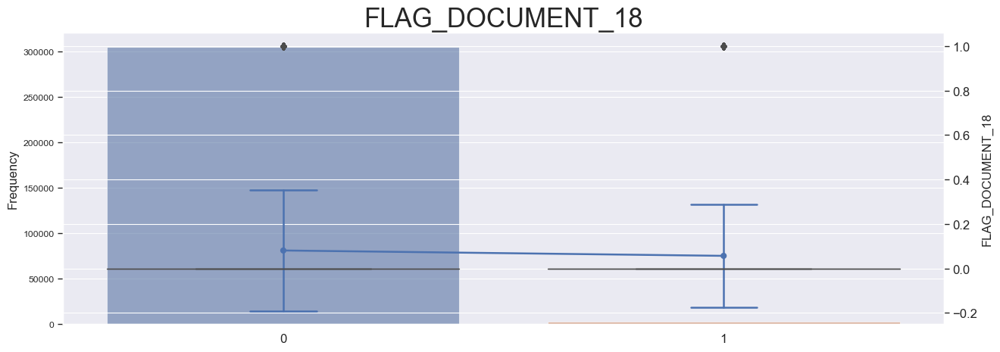

========== FLAG_DOCUMENT_19 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

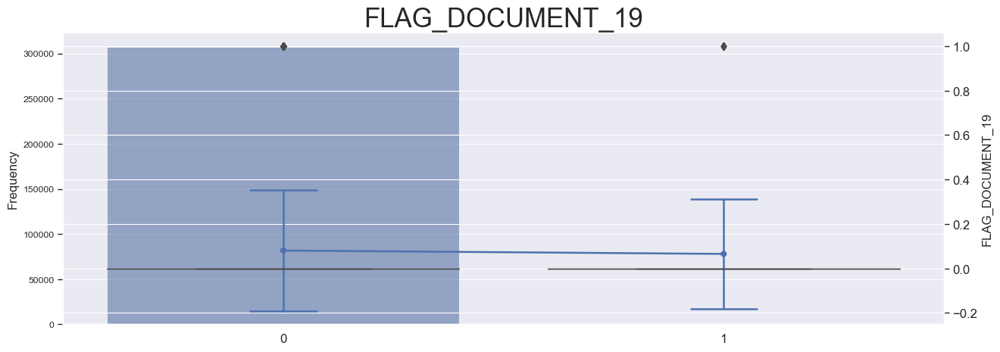

========== FLAG_DOCUMENT_20 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

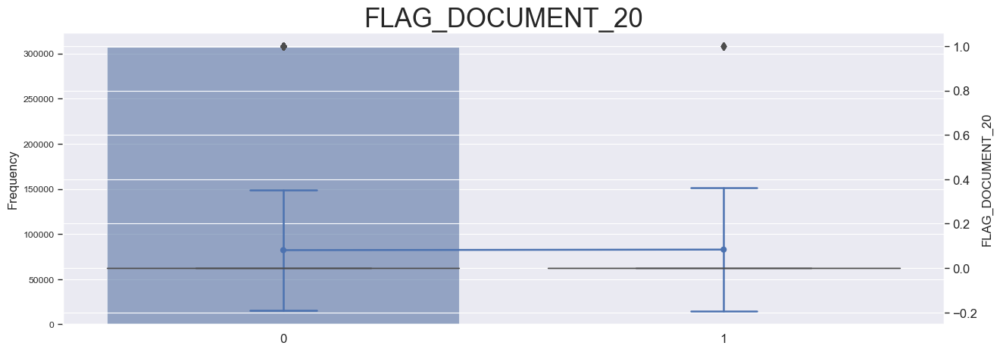

========== FLAG_DOCUMENT_21 ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

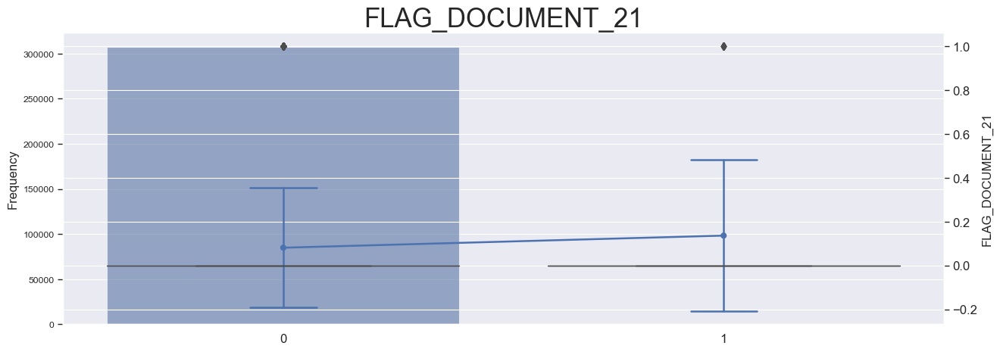

In [136]:
for coluna in bin_columns:
    print("="*10, coluna, "="*10)
        
    descrite_plot_box(df,coluna)

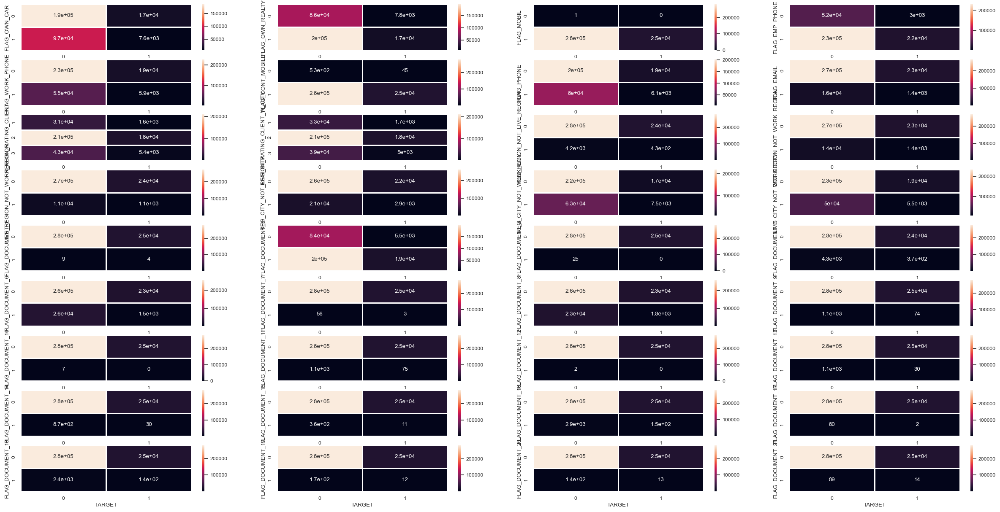

In [153]:
fig, ax = plt.subplots(9, 4, figsize=(30,15))

for i in range(len(bin_columns)):
    
    ctab = pd.crosstab(df[bin_columns[i]],
                       df['TARGET'],
                       #normalize='columns'
                      );
    sns.set(font_scale=.8)
    sns.heatmap(ctab,
                annot=True,
                
                ax=ax[i//4][i%4],
                linewidths=1)

#### 4.3.15. Categorical variables

In [97]:
cat_features = df.select_dtypes(include='object').columns.values

========== NAME_CONTRACT_TYPE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

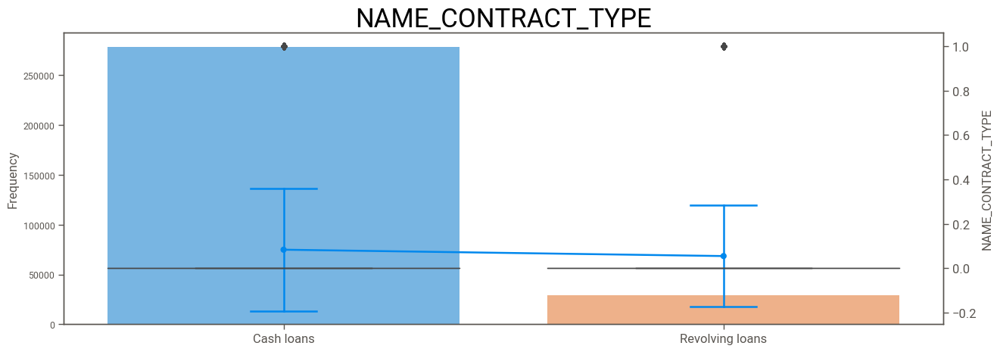

========== CODE_GENDER ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

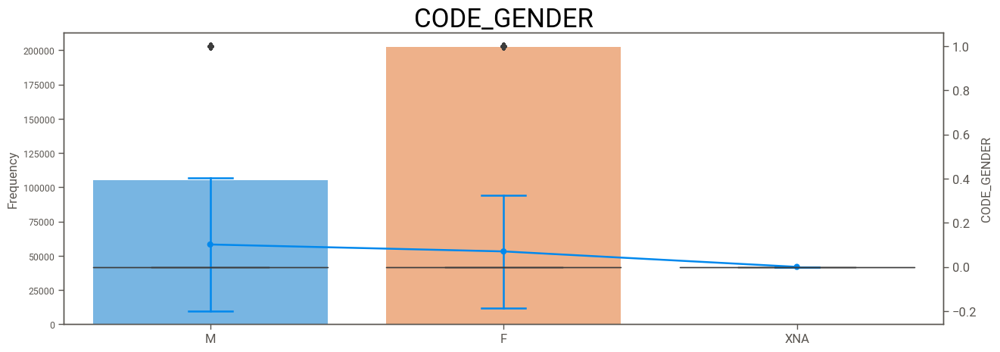

========== NAME_TYPE_SUITE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

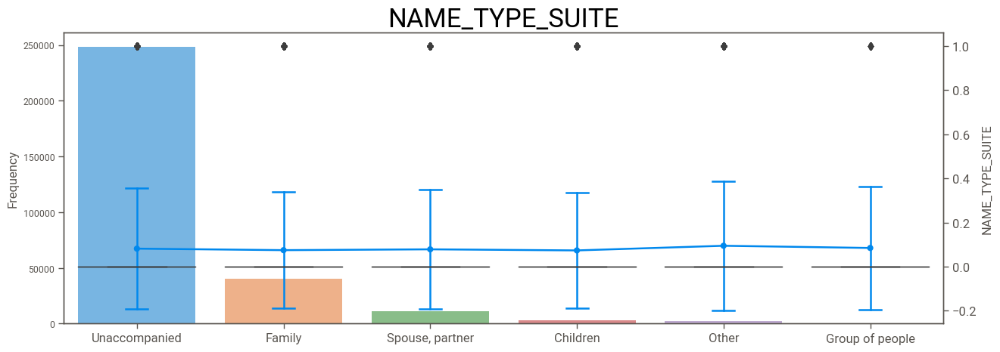

========== NAME_INCOME_TYPE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

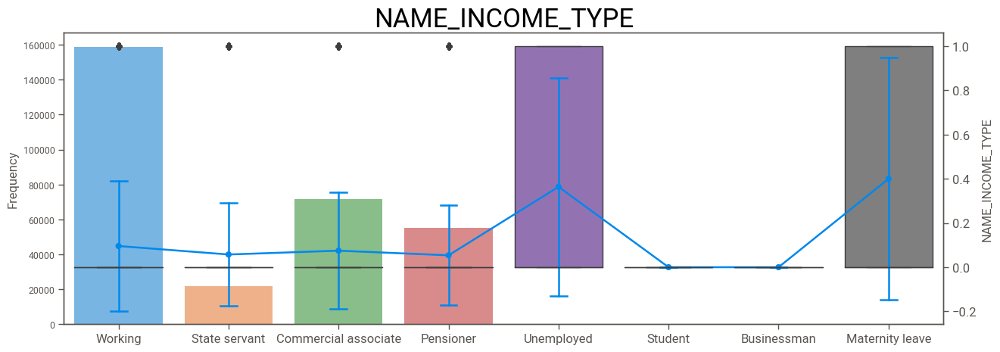

========== NAME_EDUCATION_TYPE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

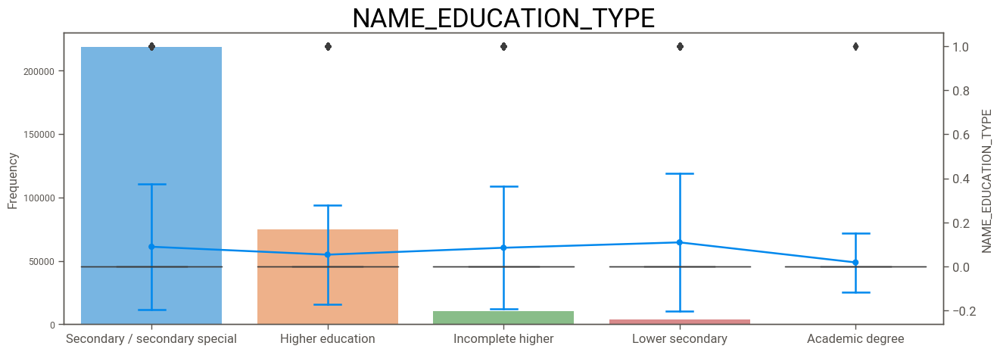

========== NAME_FAMILY_STATUS ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

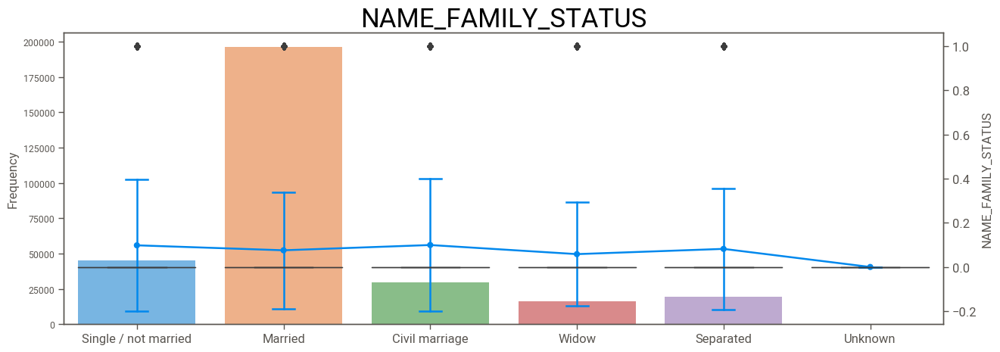

========== NAME_HOUSING_TYPE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

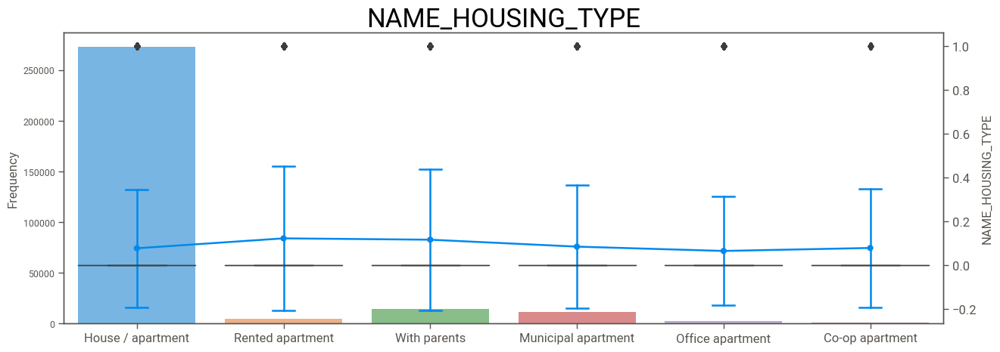

========== OCCUPATION_TYPE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

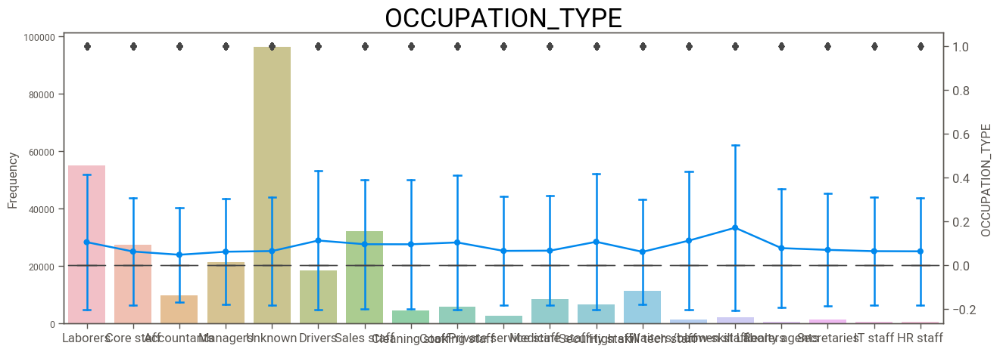

========== WEEKDAY_APPR_PROCESS_START ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

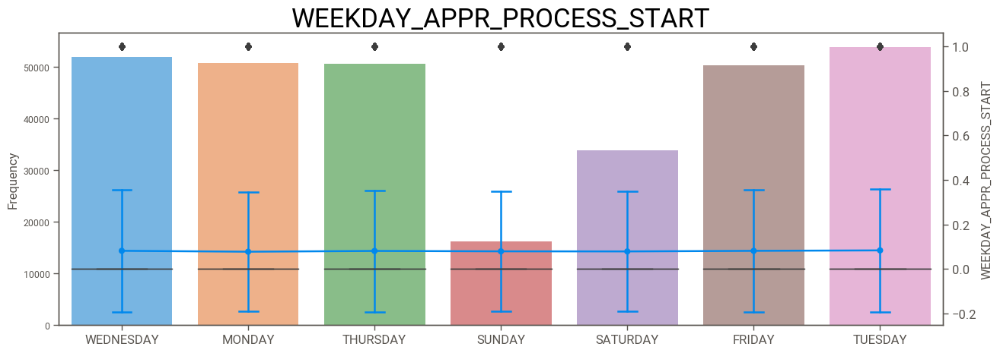

========== ORGANIZATION_TYPE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

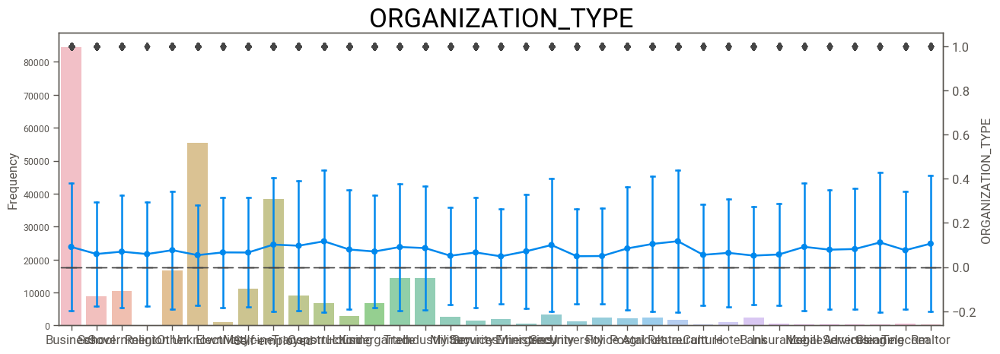

========== FONDKAPREMONT_MODE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

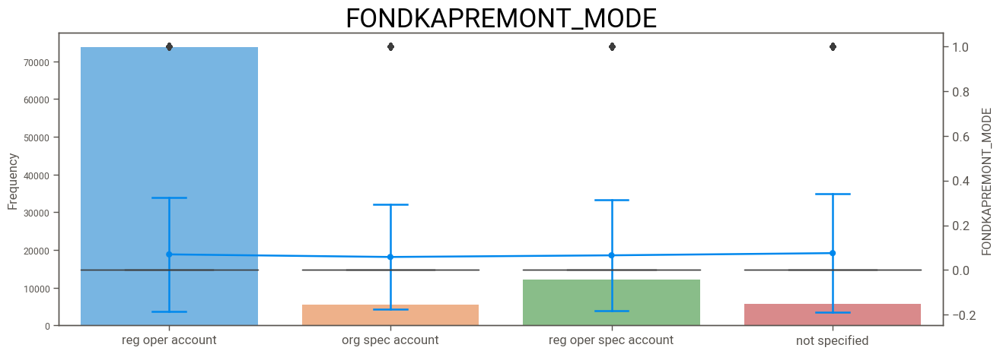

========== HOUSETYPE_MODE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

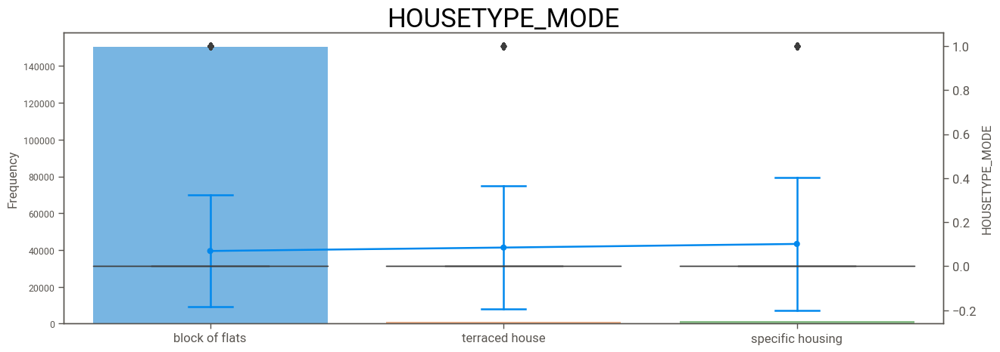

========== WALLSMATERIAL_MODE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

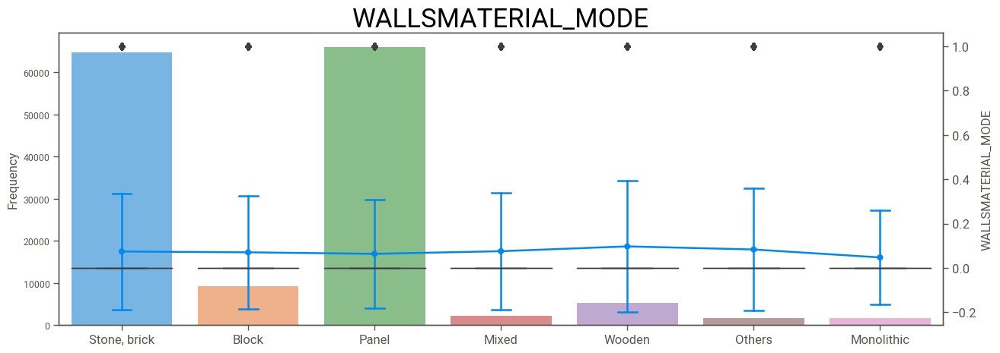

========== EMERGENCYSTATE_MODE ==========


D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
D:\Camila\anaconda3\envs\projeto_MBA_ML\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_3372\684475227.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointp

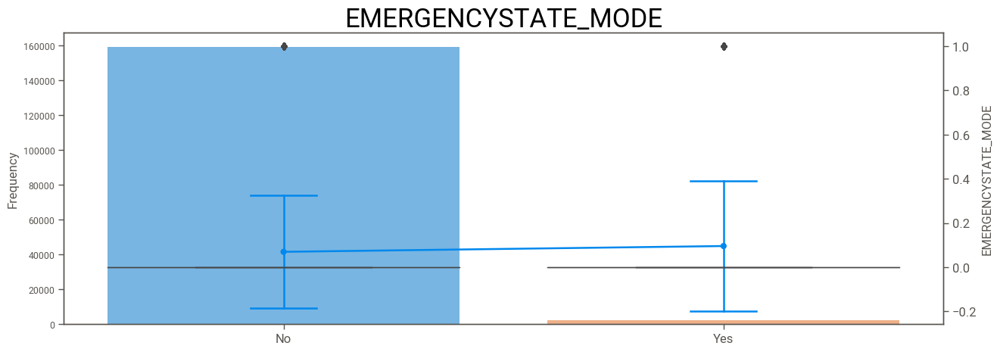

In [98]:
for coluna in cat_features:
    print("="*10, coluna, "="*10)
        
    descrite_plot_box(df,coluna)

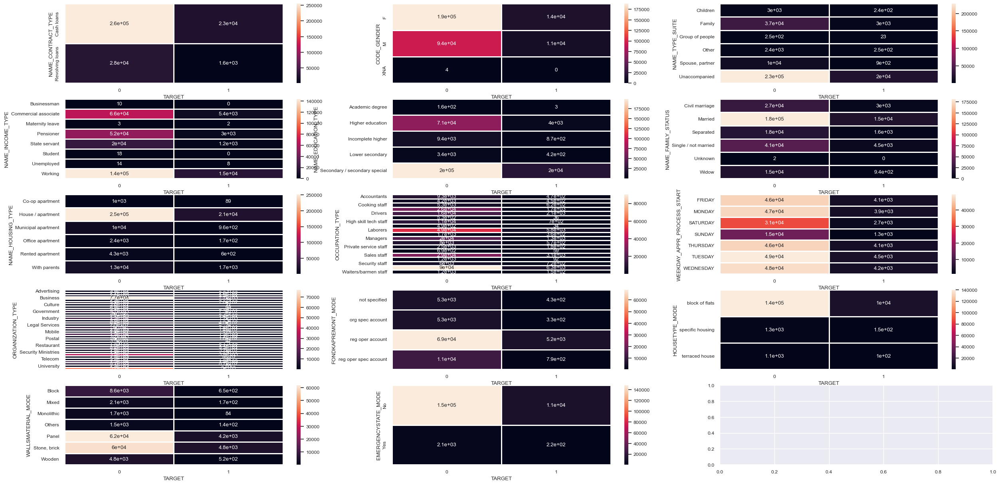

In [154]:
fig, ax = plt.subplots(5, 3, figsize=(30,15))

for i in range(len(cat_features)):
    
    ctab = pd.crosstab(df[cat_features[i]],
                       df['TARGET'],
                       );

    sns.heatmap(ctab,
                annot=True,
                #fmt='.2%',
                ax=ax[i//3][i%3],
                linewidths=1)